# Correlation between ensemble differences between different experimental parameters

### Intialize IDPET

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from idpet.visualization import plot_comparison_matrix, Visualization
from idpet.ensemble import Ensemble
from idpet.ensemble_analysis import EnsembleAnalysis
from idpet.utils import set_verbosity

# Change verbosity level to show more information when performing the analysis.
set_verbosity("INFO")

from idpet.comparison import (
    score_adaJSD, get_adaJSD_matrix,
    score_ataJSD, get_ataJSD_profile,
    score_avg_jsd,
    score_ramaJSD, get_ramaJSD_profile,
    all_vs_all_comparison,
    process_all_vs_all_output
)

import os
import re
import subprocess


/home/sosamuli/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-10-16 00:21:38.301288: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-16 00:21:38.314720: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-10-16 00:21:38.501838: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-10-16 00:21:38.673588: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factor

### Intialize FAIRMD databank

In [2]:
from fairmd.idp.protein_functions import *
import yaml

databankPath = "/home/sosamuli/work/NMRlipids/IDPdatabank/"  # this is the local path for the cloned Databank
os.environ["NMLDB_ROOT_PATH"] = "/home/sosamuli/work/NMRlipids/IDPdatabank/"


# These two lines include core Databank routines and Databank API
from fairmd.idp.core import *
from fairmd.idp.databankLibrary import *
# This is for plotting
from fairmd.idp.databankio import *
from fairmd.idp.plottings import plotSimulation
#from IPython.display import display, Markdown

# This initializes the databank and stores the information of all simulations into a list.
# Each list item contains the information from README.yaml file of the given simulation.
systems = initialize_databank()

Databank initialized from the folder: /home/sosamuli/work/NMRlipids/IDPsimBank/Data/Simulations


### Create pairs of FAIRDMD databank IDs for a set of simulations of a given protein

In [3]:
import itertools

#protein = 'ChiZ1-64'
#protein = 'KRS1-72'
protein = 'syn'

all_IDs = []
for system in systems:
    if protein in system['SYSTEM']:
        all_IDs.append(system['ID'])

print('Found IDs: ', all_IDs)

pairs = list(itertools.combinations(all_IDs, 2))

Found IDs:  [87, 93, 90, 71, 76, 88, 61, 65, 66, 73, 69, 57, 91, 98, 63, 77, 81, 74, 89, 86, 52, 53, 92, 62]


In [4]:
import numpy as np

def compute_relaxation_differences(dict_a, dict_b):
    """
    Compute differences in T1, T2, and hetNOE between two nested dictionaries,
    and also calculate per-field RMSDs across residues.

    Parameters
    ----------
    dict_a, dict_b : dict
        Nested dictionaries of the form:
        {
            residue: {
                field: {
                    observable: {"value": float}
                }
            }
        }

    Returns
    -------
    results : dict
        {
            "differences": {
                residue: {
                    field: {
                        observable: diff (float or None)
                    }
                }
            },
            "rmsd": {
                field: {
                    observable: rmsd_value (float or None)
                }
            }
        }
        Differences are dict_a - dict_b.
    """
    differences = {}
    rmsd_data = {}  # collect differences for RMSD calculation

    residues = set(dict_a.keys()) | set(dict_b.keys())

    for res in residues:
        differences[res] = {}
        fields = set(dict_a.get(res, {}).keys()) | set(dict_b.get(res, {}).keys())
        for field in fields:
            differences[res][field] = {}
            for observable in ["T1", "T2", "hetNOE"]:
                val_a = dict_a.get(res, {}).get(field, {}).get(observable, {}).get("value")
                val_b = dict_b.get(res, {}).get(field, {}).get(observable, {}).get("value")
                if val_a is not None and val_b is not None:
                    diff = val_a - val_b
                    differences[res][field][observable] = diff
                    # store for RMSD
                    rmsd_data.setdefault(field, {}).setdefault(observable, []).append(diff)
                else:
                    differences[res][field][observable] = None

    # Compute RMSDs
    rmsd = {}
    for field, obs_dict in rmsd_data.items():
        rmsd[field] = {}
        for observable, diffs in obs_dict.items():
            diffs = np.array(diffs)
            rmsd[field][observable] = float(np.sqrt(np.mean(diffs**2))) if diffs.size > 0 else None

    return {"differences": differences, "rmsd": rmsd}


In [5]:
import numpy as np

def compute_relaxation_rate_differences(dict_a, dict_b):
    """
    Compute differences in R1=1/T1, R2=1/T2, and hetNOE between two nested dictionaries,
    and calculate per-field RMSDs across residues.

    Parameters
    ----------
    dict_a, dict_b : dict
        Nested dictionaries of the form:
        {
            residue: {
                field: {
                    observable: {"value": float}
                }
            }
        }

    Returns
    -------
    results : dict
        {
            "differences": {
                residue: {
                    field: {
                        R1: diff (float or None),
                        R2: diff (float or None),
                        hetNOE: diff (float or None)
                    }
                }
            },
            "rmsd": {
                field: {
                    R1: rmsd_value (float or None),
                    R2: rmsd_value (float or None),
                    hetNOE: rmsd_value (float or None)
                }
            }
        }
        Differences are dict_a - dict_b.
    """
    differences = {}
    rmsd_data = {}

    residues = set(dict_a.keys()) | set(dict_b.keys())

    for res in residues:
        differences[res] = {}
        fields = set(dict_a.get(res, {}).keys()) | set(dict_b.get(res, {}).keys())
        for field in fields:
            differences[res][field] = {}
            # R1 = 1/T1
            for obs, new_obs in [("T1", "R1"), ("T2", "R2")]:
                val_a = dict_a.get(res, {}).get(field, {}).get(obs, {}).get("value")
                val_b = dict_b.get(res, {}).get(field, {}).get(obs, {}).get("value")
                if val_a and val_b:  # avoid division by zero or None
                    r_a, r_b = 1.0 / val_a, 1.0 / val_b
                    diff = r_a - r_b
                    differences[res][field][new_obs] = diff
                    rmsd_data.setdefault(field, {}).setdefault(new_obs, []).append(diff)
                else:
                    differences[res][field][new_obs] = None

            # hetNOE (no inversion)
            val_a = dict_a.get(res, {}).get(field, {}).get("hetNOE", {}).get("value")
            val_b = dict_b.get(res, {}).get(field, {}).get("hetNOE", {}).get("value")
            if val_a is not None and val_b is not None:
                diff = val_a - val_b
                differences[res][field]["hetNOE"] = diff
                rmsd_data.setdefault(field, {}).setdefault("hetNOE", []).append(diff)
            else:
                differences[res][field]["hetNOE"] = None

    # Compute RMSDs
    rmsd = {}
    for field, obs_dict in rmsd_data.items():
        rmsd[field] = {}
        for observable, diffs in obs_dict.items():
            diffs = np.array(diffs)
            rmsd[field][observable] = float(np.sqrt(np.mean(diffs**2))) if diffs.size > 0 else None

    return {"differences": differences, "rmsd": rmsd}


In [6]:
import math
import numpy as np

def compute_chemical_shift_differences(dict1, dict2):
    """
    Compute chemical shift differences and RMSDs between two datasets.
    
    Parameters
    ----------
    dict1, dict2 : dict
        Dictionaries of the form:
        {
            residue_number: {
                nucleus: value,
                ...
            },
            ...
        }
    
    Returns
    -------
    results : dict
        {
            "differences": {
                residue_number: {
                    nucleus: difference (dict1 - dict2),
                    ...
                },
                ...
            },
            "rmsd": {
                nucleus: RMSD across all residues
            }
        }
    """
    differences = {}
    diff_by_nucleus = {}

    # Iterate over residues present in both
    for res in set(dict1.keys()).intersection(dict2.keys()):
        differences[res] = {}
        for nucleus in set(dict1[res].keys()).intersection(dict2[res].keys()):
            val1 = dict1[res][nucleus]
            val2 = dict2[res][nucleus]
            diff = val1 - val2
            differences[res][nucleus] = diff
            diff_by_nucleus.setdefault(nucleus, []).append(diff)

    # Compute RMSD per nucleus
    rmsd = {}
    for nucleus, diffs in diff_by_nucleus.items():
        if diffs:
            rmsd[nucleus] = math.sqrt(np.mean(np.square(diffs)))
        else:
            rmsd[nucleus] = None

    return {
        "differences": differences,
        "rmsd": rmsd
    }


In [7]:
def parse_trj_info(ID,systems):
    for system in systems:
        if system['ID'] != ID:
            continue
        data_folder = '../../Data/Simulations/' + system['path']
        trj_path = data_folder + system['TRJ'][0][0]
        """Extract replica name and force field from a trajectory file path."""
        fname = os.path.basename(trj_path)  # e.g. replica_03_AMBER03WS_md_1500ns.xtc
        parts = fname.split("_")
        replica = parts[0] + "_" + parts[1]   # "replica_03"
        forcefield = parts[2]                 # "AMBER03WS"
        return replica, forcefield


In [8]:
import numpy as np
from scipy.spatial.distance import jensenshannon

def read_rg_values(filename):
    """Read Rg (2nd column) values from a GROMACS gyrate .xvg file."""
    rg_values = []
    with open(filename, 'r') as f:
        for line in f:
            line = line.strip()
            if not line or line.startswith(('#', '@')):
                continue
            parts = line.split()
            if len(parts) >= 2:
                try:
                    rg_values.append(float(parts[1]))
                except ValueError:
                    continue
    return np.array(rg_values)


def js_rg_similarity(file1, file2, bins=80, rg_range=None):
    """
    Compute the Jensen–Shannon divergence between two Rg distributions.
    
    Parameters
    ----------
    file1, file2 : str
        Paths to GROMACS gyrate.xvg files.
    bins : int or array-like
        Number of bins or bin edges for histogram.
    rg_range : tuple, optional
        (min, max) range for consistent histogram binning.
    
    Returns
    -------
    float
        Jensen–Shannon divergence (mean) between the two distributions.
    """

    rg1 = read_rg_values(file1)
    rg2 = read_rg_values(file2)

    # Determine binning range
    if rg_range is None:
        rg_min = min(rg1.min(), rg2.min())
        rg_max = max(rg1.max(), rg2.max())
        rg_range = (rg_min, rg_max)

    # Compute normalized histograms (probability distributions)
    hist1, _ = np.histogram(rg1, bins=bins, range=rg_range, density=True)
    hist2, _ = np.histogram(rg2, bins=bins, range=rg_range, density=True)

    # Normalize to ensure they sum to 1
    hist1 = hist1 / np.sum(hist1)
    hist2 = hist2 / np.sum(hist2)

    # Compute JSD (squared for true divergence)
    jsd = jensenshannon(hist1, hist2, base=2)**2

    return jsd


In [9]:
comparison_data = {}

In [15]:
#comparison_data['ada_score'] = []
#comparison_data['ata_score'] = []
#comparison_data['rama_score'] = []
#comparison_data['rg_diff'] = []

for IDs in (1,2):    
    ensembles = []

    for ID, xtc_path, gro_path in file_paths:
        fname = os.path.splitext(os.path.basename(xtc_path))[0]
        code = ID
        
        relative_path = xtc_path
        folder_path = os.path.dirname(os.path.abspath(relative_path))
    
        # Paths
        xtc_file = xtc_path
        gro_file = gro_path
        nojump_traj = folder_path + '/nojump_traj.xtc'
        skipped_traj = folder_path + '/skipped_traj.xtc'
        skip_value = 10

        if not os.path.exists(skipped_traj):
            # Build the command: source GMXRC first, then run gmx
            cmd = f"""
            source /usr/local/gromacs/bin/GMXRC && \
            echo System | gmx trjconv -f {xtc_file} -s {gro_file} -skip {skip_value} -o {nojump_traj} -pbc nojump  && \
            echo -e "System\nSystem" | gmx trjconv -f {nojump_traj} -s {gro_file} -o {skipped_traj} -center
            """
            print(cmd)
            # Run inside a bash shell
            subprocess.run(cmd, shell=True, executable="/bin/bash", check=True)
    
        ens = Ensemble(
            code=code,
            data_path=skipped_traj,
            top_path=gro_path
        )
        ens.load_trajectory(data_dir=None)
        ensembles.append(ens)

    # Example: compute Flory exponent for each ensemble
    #for ens in ensembles:
    #    flory_exp = ens.get_features("flory_exponent")[0]
    #    print(f"{ens.code}: Flory exponent = {flory_exp:.3f}")

    analysis = EnsembleAnalysis(ensembles)
    analysis.load_trajectories()

    code_list = []
    for e in analysis.ensembles:
        code_list.append(e.code)   # if it has .code

    ens_1 = analysis[code_list[0]]
    ens_2 = analysis[code_list[1]]

    print('Systems with FAIRMD IDs', code_list[0], 'and', code_list[1],'analyzed')

    ens_1_rg = np.mean(ens_1.get_features("rg"))
    ens_2_rg = np.mean(ens_2.get_features("rg"))
    rg_diff = ens_1_rg-ens_2_rg
    
    ada_score, ada_bins = score_adaJSD(ens_1, ens_2, bins="auto", return_bins=True)
    print(f"- adaJSD score: {ada_score:.4f}, bins used: {bins}")

    ata_score, ata_bins = score_ataJSD(ens_1, ens_2, bins="auto", return_bins=True)
    print(f"- ataJSD score: {ata_score:.4f}, bins used: {bins}")

    rama_score, rama_bins = score_ramaJSD(ens_1, ens_2, bins=5, return_bins=True)
    print(f"- ramaJSD score: {rama_score:.4f}, bins used: {bins}")

 
    #comparison_data['ada_score'].append(ada_score)
    #comparison_data['ata_score'].append(ata_score)
    #comparison_data['rama_score'].append(rama_score)
    #comparison_data['rg_diff'].append(rg_diff)


Loading trajectory for 49...
Loading trajectory for 50...
Loading trajectory for 49...
Loading trajectory for 50...


Systems with FAIRMD IDs 49 and 50 analyzed


NameError: name 'bins' is not defined

In [9]:
import os
import subprocess
import numpy as np
from concurrent.futures import ProcessPoolExecutor
from functools import partial
import gc

def process_pair(IDs, systems):
    """
    Process and analyze a pair of molecular dynamics trajectories.

    This function locates trajectory files for two specified simulation systems,
    performs preprocessing with GROMACS (`trjconv`), loads the processed trajectories
    into `Ensemble` objects, and computes similarity scores and feature differences
    between the two ensembles.

    Parameters
    ----------
    IDs : list of str or int
        Identifiers of the two systems to analyze. Only systems with matching IDs
        from the `systems` input are processed.
    systems : list of dict
        A list of system descriptors, where each dictionary must contain:
          - 'ID' : str or int
              System identifier.
          - 'path' : str
              Relative path to the simulation data folder.
          - 'TRJ' : list
              Nested list with at least one entry, where the first item is the
              trajectory filename (XTC format).

    Returns
    -------
    dict
        Dictionary containing analysis metrics:
        - "ada_score" : float
            Jensen–Shannon divergence (ADA features).
        - "ata_score" : float
            Jensen–Shannon divergence (ATA features).
        - "rama_score" : float
            Jensen–Shannon divergence (Ramachandran features).
        - "rg_diff" : float
            Difference in mean radius of gyration between the two systems.

    Notes
    -----
    - This function assumes GROMACS is installed and accessible at
      `/usr/local/gromacs/bin/GMXRC`.
    - Processed trajectories (`nojump_traj.xtc`, `skipped_traj.xtc`) are written
      in the same folder as the original trajectory file.
    - Requires custom classes `Ensemble` and `EnsembleAnalysis` as well as
      scoring functions `score_adaJSD`, `score_ataJSD`, and `score_ramaJSD`.

    """
    ensembles = []

    file_paths = []   # now local, populated from systems
    for system in systems:
        ID = system['ID']
        if ID in IDs:
            data_folder = '../../Data/Simulations/' + system['path']
            trj = data_folder + system['TRJ'][0][0]
            gro = data_folder + 'protein_centered.gro'
            file_paths.append((ID, trj, gro))
    
    for ID, xtc_path, gro_path in file_paths:
        fname = os.path.splitext(os.path.basename(xtc_path))[0]
        code = ID
        folder_path = os.path.dirname(os.path.abspath(xtc_path))
    
        nojump_traj = folder_path + '/nojump_traj.xtc'
        skipped_traj = folder_path + '/skipped_traj.xtc'
        skip_value = 10

        if not os.path.exists(skipped_traj):
            cmd = f"""
            source /usr/local/gromacs/bin/GMXRC && \
            echo System | gmx trjconv -f {xtc_path} -s {gro_path} -skip {skip_value} -o {nojump_traj} -pbc nojump  && \
            echo -e "System\nSystem" | gmx trjconv -f {nojump_traj} -s {gro_path} -o {skipped_traj} -center
            """
            subprocess.run(cmd, shell=True, executable="/bin/bash", check=True)
    
        ens = Ensemble(code=code, data_path=skipped_traj, top_path=gro_path)
        ens.load_trajectory()
        ensembles.append(ens)

    analysis = EnsembleAnalysis(ensembles)
    analysis.load_trajectories()

    code_list = [e.code for e in analysis.ensembles]
    ens_1, ens_2 = analysis[code_list[0]], analysis[code_list[1]]

    print(f"Systems {code_list[0]} and {code_list[1]} analyzed")

    ens_1_rg = np.mean(ens_1.get_features("rg"))
    ens_2_rg = np.mean(ens_2.get_features("rg"))
    rg_diff = ens_1_rg - ens_2_rg
    
    ada_score, _ = score_adaJSD(ens_1, ens_2, bins="auto", return_bins=True)
    ata_score, _ = score_ataJSD(ens_1, ens_2, bins="auto", return_bins=True)
    rama_score, _ = score_ramaJSD(ens_1, ens_2, bins=5, return_bins=True)

    # cleanup
    del ens_1, ens_2, analysis
    gc.collect()

    return {
        "ada_score": ada_score,
        "ata_score": ata_score,
        "rama_score": rama_score,
        "rg_diff": rg_diff,
    }



In [10]:

# --- Parallel execution ---
comparison_data = {k: [] for k in ["ada_score", "ata_score", "rama_score", "rg_diff"]}

process_with_systems = partial(process_pair, systems=systems)

with ProcessPoolExecutor(max_workers=15) as executor:   # reduce workers!
    results = list(executor.map(process_with_systems, pairs))

# Collect results safely
for res in results:
    if res is None:
        continue
    for key in comparison_data:
        comparison_data[key].append(res[key])

print("Final comparison_data:", comparison_data)


Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 19...
Loading trajectory for 12...
Loading trajectory for 28...
Loading trajectory for 11...
Loading trajectory for 24...
Loading trajectory for 22...
Loading trajectory for 6...
Loading trajectory for 4...
Loading trajectory for 20...
Loading trajectory for 16...
Loading trajectory for 7...
Loading trajectory for 10...
Loading trajectory for 3...
Loading trajectory for 18...
Loading trajectory for 29...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading t

Systems 2 and 28 analyzed
Systems 2 and 24 analyzed


Loading trajectory for 29...


Systems 2 and 11 analyzed


Loading trajectory for 4...


Systems 2 and 12 analyzed


Loading trajectory for 10...
Loading trajectory for 3...
Loading trajectory for 18...


Systems 2 and 6 analyzed


Loading trajectory for 7...
Loading trajectory for 16...


Systems 2 and 22 analyzed
Systems 2 and 20 analyzed
Systems 2 and 19 analyzed
Systems 2 and 4 analyzed
Systems 2 and 29 analyzed
Systems 2 and 18 analyzed
Systems 2 and 10 analyzed
Systems 2 and 3 analyzed
Systems 2 and 7 analyzed
Systems 2 and 16 analyzed


Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 32...
Loading trajectory for 34...
Loading trajectory for 33...
Loading trajectory for 35...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 35...
Loading trajectory for 33...
Loading trajectory for 34...
Loading trajectory for 32...
Loading trajectory for 36...


Systems 2 and 35 analyzed
Systems 2 and 34 analyzed


Loading trajectory for 2...


Systems 2 and 33 analyzed
Systems 2 and 32 analyzed


Loading trajectory for 36...
Loading trajectory for 2...


Systems 2 and 36 analyzed


Loading trajectory for 41...
Loading trajectory for 2...
Loading trajectory for 41...


Systems 2 and 41 analyzed


Loading trajectory for 2...
Loading trajectory for 43...
Loading trajectory for 2...
Loading trajectory for 2...
Loading trajectory for 44...
Loading trajectory for 2...
Loading trajectory for 43...
Loading trajectory for 47...


Systems 2 and 43 analyzed


Loading trajectory for 2...
Loading trajectory for 44...
Loading trajectory for 2...


Systems 2 and 44 analyzed


Loading trajectory for 47...


Systems 2 and 47 analyzed


Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 4...
Loading trajectory for 7...
Loading trajectory for 6...
Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 11...
Loading trajectory for 10...
Loading trajectory for 3...
Loading trajectory for 7...
Loading trajectory for 12...
Loading trajectory for 4...


Systems 3 and 7 analyzed


Loading trajectory for 3...
Loading trajectory for 6...
Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 10...


Systems 3 and 4 analyzed


Loading trajectory for 11...


Systems 3 and 6 analyzed


Loading trajectory for 12...


Systems 3 and 10 analyzed
Systems 3 and 12 analyzed
Systems 3 and 11 analyzed


Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 16...
Loading trajectory for 3...
Loading trajectory for 18...
Loading trajectory for 16...
Loading trajectory for 3...


Systems 3 and 16 analyzed


Loading trajectory for 18...


Systems 3 and 18 analyzed


Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 19...
Loading trajectory for 3...
Loading trajectory for 20...
Loading trajectory for 19...
Loading trajectory for 3...


Systems 3 and 19 analyzed


Loading trajectory for 20...


Systems 3 and 20 analyzed


Loading trajectory for 3...
Loading trajectory for 22...
Loading trajectory for 3...
Loading trajectory for 22...
Loading trajectory for 3...


Systems 3 and 22 analyzed


Loading trajectory for 24...
Loading trajectory for 3...
Loading trajectory for 24...
Loading trajectory for 3...


Systems 3 and 24 analyzed


Loading trajectory for 28...
Loading trajectory for 3...
Loading trajectory for 28...
Loading trajectory for 3...


Systems 3 and 28 analyzed


Loading trajectory for 29...
Loading trajectory for 3...
Loading trajectory for 29...
Loading trajectory for 3...
Loading trajectory for 3...


Systems 3 and 29 analyzed


Loading trajectory for 32...
Loading trajectory for 33...
Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 34...
Loading trajectory for 35...
Loading trajectory for 32...
Loading trajectory for 36...
Loading trajectory for 33...
Loading trajectory for 3...
Loading trajectory for 3...


Systems 3 and 32 analyzed
Systems 3 and 33 analyzed


Loading trajectory for 3...
Loading trajectory for 34...
Loading trajectory for 35...
Loading trajectory for 36...


Systems 3 and 34 analyzed
Systems 3 and 35 analyzed
Systems 3 and 36 analyzed


Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 41...
Loading trajectory for 43...
Loading trajectory for 3...
Loading trajectory for 3...
Loading trajectory for 41...
Loading trajectory for 43...


Systems 3 and 41 analyzed
Systems 3 and 43 analyzed


Loading trajectory for 3...
Loading trajectory for 44...
Loading trajectory for 3...
Loading trajectory for 44...


Systems 3 and 44 analyzed


Loading trajectory for 3...
Loading trajectory for 47...
Loading trajectory for 3...
Loading trajectory for 4...
Loading trajectory for 47...
Loading trajectory for 6...


Systems 3 and 47 analyzed


Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 7...
Loading trajectory for 10...
Loading trajectory for 6...
Loading trajectory for 4...


Systems 4 and 6 analyzed


Loading trajectory for 4...
Loading trajectory for 7...
Loading trajectory for 10...


Systems 4 and 7 analyzed
Systems 4 and 10 analyzed


Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 11...
Loading trajectory for 12...
Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 11...
Loading trajectory for 12...


Systems 4 and 11 analyzed
Systems 4 and 12 analyzed


Loading trajectory for 4...
Loading trajectory for 16...
Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 18...
Loading trajectory for 16...
Loading trajectory for 19...
Loading trajectory for 20...
Loading trajectory for 4...


Systems 4 and 16 analyzed


Loading trajectory for 4...
Loading trajectory for 18...
Loading trajectory for 4...


Systems 4 and 18 analyzed


Loading trajectory for 19...
Loading trajectory for 20...
Loading trajectory for 4...


Systems 4 and 20 analyzed
Systems 4 and 19 analyzed


Loading trajectory for 22...
Loading trajectory for 4...
Loading trajectory for 22...
Loading trajectory for 4...
Loading trajectory for 4...


Systems 4 and 22 analyzed


Loading trajectory for 4...
Loading trajectory for 28...
Loading trajectory for 24...
Loading trajectory for 29...
Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 28...
Loading trajectory for 24...


Systems 4 and 24 analyzed


Loading trajectory for 29...


Systems 4 and 28 analyzed
Systems 4 and 29 analyzed


Loading trajectory for 4...
Loading trajectory for 32...
Loading trajectory for 4...
Loading trajectory for 32...


Systems 4 and 32 analyzed


Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 33...
Loading trajectory for 34...
Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 33...
Loading trajectory for 34...


Systems 4 and 33 analyzed
Systems 4 and 34 analyzed


Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 35...
Loading trajectory for 36...
Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 41...
Loading trajectory for 36...
Loading trajectory for 4...
Loading trajectory for 35...


Systems 4 and 36 analyzed


Loading trajectory for 41...


Systems 4 and 35 analyzed
Systems 4 and 41 analyzed


Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 43...
Loading trajectory for 44...
Loading trajectory for 6...
Loading trajectory for 4...
Loading trajectory for 47...
Loading trajectory for 4...
Loading trajectory for 4...
Loading trajectory for 43...
Loading trajectory for 7...
Loading trajectory for 44...
Loading trajectory for 47...


Systems 4 and 43 analyzed


Loading trajectory for 6...


Systems 4 and 44 analyzed


Loading trajectory for 6...


Systems 4 and 47 analyzed


Loading trajectory for 10...
Loading trajectory for 7...
Loading trajectory for 6...


Systems 6 and 7 analyzed


Loading trajectory for 10...
Loading trajectory for 6...


Systems 6 and 10 analyzed


Loading trajectory for 6...
Loading trajectory for 11...
Loading trajectory for 6...
Loading trajectory for 6...
Loading trajectory for 12...
Loading trajectory for 16...
Loading trajectory for 11...
Loading trajectory for 6...


Systems 6 and 11 analyzed


Loading trajectory for 6...
Loading trajectory for 12...


Systems 6 and 12 analyzed


Loading trajectory for 16...


Systems 6 and 16 analyzed


Loading trajectory for 6...
Loading trajectory for 18...
Loading trajectory for 6...
Loading trajectory for 18...


Systems 6 and 18 analyzed


Loading trajectory for 6...
Loading trajectory for 19...
Loading trajectory for 6...
Loading trajectory for 6...
Loading trajectory for 19...
Loading trajectory for 20...


Systems 6 and 19 analyzed


Loading trajectory for 6...
Loading trajectory for 6...
Loading trajectory for 20...
Loading trajectory for 22...
Loading trajectory for 6...


Systems 6 and 20 analyzed


Loading trajectory for 24...
Loading trajectory for 6...
Loading trajectory for 6...
Loading trajectory for 22...
Loading trajectory for 24...


Systems 6 and 22 analyzed


Loading trajectory for 6...


Systems 6 and 24 analyzed


Loading trajectory for 6...
Loading trajectory for 28...
Loading trajectory for 6...
Loading trajectory for 29...
Loading trajectory for 28...
Loading trajectory for 6...
Loading trajectory for 6...


Systems 6 and 28 analyzed


Loading trajectory for 29...
Loading trajectory for 32...


Systems 6 and 29 analyzed


Loading trajectory for 6...
Loading trajectory for 6...
Loading trajectory for 33...
Loading trajectory for 32...
Loading trajectory for 6...
Loading trajectory for 6...
Loading trajectory for 6...


Systems 6 and 32 analyzed


Loading trajectory for 35...
Loading trajectory for 33...
Loading trajectory for 34...
Loading trajectory for 6...
Loading trajectory for 6...
Loading trajectory for 6...


Systems 6 and 33 analyzed


Loading trajectory for 35...
Loading trajectory for 34...


Systems 6 and 35 analyzed


Loading trajectory for 6...
Loading trajectory for 36...


Systems 6 and 34 analyzed


Loading trajectory for 6...
Loading trajectory for 41...
Loading trajectory for 43...
Loading trajectory for 6...
Loading trajectory for 6...
Loading trajectory for 6...
Loading trajectory for 6...
Loading trajectory for 36...
Loading trajectory for 43...
Loading trajectory for 41...


Systems 6 and 43 analyzed
Systems 6 and 36 analyzed


Loading trajectory for 44...


Systems 6 and 41 analyzed


Loading trajectory for 6...
Loading trajectory for 44...


Systems 6 and 44 analyzed


Loading trajectory for 6...
Loading trajectory for 47...
Loading trajectory for 6...
Loading trajectory for 47...


Systems 6 and 47 analyzed


Loading trajectory for 7...
Loading trajectory for 10...
Loading trajectory for 7...
Loading trajectory for 7...
Loading trajectory for 11...
Loading trajectory for 10...
Loading trajectory for 7...


Systems 7 and 10 analyzed


Loading trajectory for 11...


Systems 7 and 11 analyzed


Loading trajectory for 7...
Loading trajectory for 12...
Loading trajectory for 7...
Loading trajectory for 12...
Loading trajectory for 7...


Systems 7 and 12 analyzed


Loading trajectory for 7...
Loading trajectory for 16...
Loading trajectory for 18...
Loading trajectory for 7...
Loading trajectory for 7...
Loading trajectory for 18...
Loading trajectory for 16...


Systems 7 and 18 analyzed
Systems 7 and 16 analyzed


Loading trajectory for 7...
Loading trajectory for 7...
Loading trajectory for 19...
Loading trajectory for 7...
Loading trajectory for 20...
Loading trajectory for 7...
Loading trajectory for 22...
Loading trajectory for 7...
Loading trajectory for 19...
Loading trajectory for 7...
Loading trajectory for 20...
Loading trajectory for 7...


Systems 7 and 19 analyzed


Loading trajectory for 22...
Loading trajectory for 24...
Loading trajectory for 7...


Systems 7 and 20 analyzed
Systems 7 and 22 analyzed


Loading trajectory for 7...
Loading trajectory for 28...
Loading trajectory for 24...
Loading trajectory for 7...


Systems 7 and 24 analyzed


Loading trajectory for 28...


Systems 7 and 28 analyzed


Loading trajectory for 7...
Loading trajectory for 29...
Loading trajectory for 7...
Loading trajectory for 29...


Systems 7 and 29 analyzed


Loading trajectory for 7...
Loading trajectory for 7...
Loading trajectory for 32...
Loading trajectory for 33...
Loading trajectory for 7...
Loading trajectory for 7...
Loading trajectory for 32...
Loading trajectory for 33...


Systems 7 and 32 analyzed
Systems 7 and 33 analyzed


Loading trajectory for 7...
Loading trajectory for 34...
Loading trajectory for 7...
Loading trajectory for 34...


Systems 7 and 34 analyzed


Loading trajectory for 7...
Loading trajectory for 35...
Loading trajectory for 7...
Loading trajectory for 35...


Systems 7 and 35 analyzed


Loading trajectory for 7...
Loading trajectory for 36...
Loading trajectory for 7...
Loading trajectory for 36...


Systems 7 and 36 analyzed


Loading trajectory for 7...
Loading trajectory for 7...
Loading trajectory for 41...
Loading trajectory for 43...
Loading trajectory for 7...
Loading trajectory for 7...
Loading trajectory for 7...
Loading trajectory for 41...
Loading trajectory for 43...
Loading trajectory for 44...


Systems 7 and 41 analyzed
Systems 7 and 43 analyzed


Loading trajectory for 7...
Loading trajectory for 44...


Systems 7 and 44 analyzed


Loading trajectory for 7...
Loading trajectory for 47...
Loading trajectory for 10...
Loading trajectory for 7...
Loading trajectory for 10...
Loading trajectory for 11...
Loading trajectory for 47...
Loading trajectory for 10...
Loading trajectory for 12...
Loading trajectory for 10...


Systems 7 and 47 analyzed


Loading trajectory for 16...
Loading trajectory for 11...
Loading trajectory for 10...
Loading trajectory for 10...


Systems 10 and 11 analyzed


Loading trajectory for 12...
Loading trajectory for 16...


Systems 10 and 12 analyzed


Loading trajectory for 10...


Systems 10 and 16 analyzed


Loading trajectory for 18...
Loading trajectory for 10...
Loading trajectory for 18...
Loading trajectory for 10...


Systems 10 and 18 analyzed


Loading trajectory for 19...
Loading trajectory for 10...
Loading trajectory for 19...
Loading trajectory for 10...


Systems 10 and 19 analyzed


Loading trajectory for 20...
Loading trajectory for 10...
Loading trajectory for 10...
Loading trajectory for 20...
Loading trajectory for 22...


Systems 10 and 20 analyzed


Loading trajectory for 10...
Loading trajectory for 22...
Loading trajectory for 10...


Systems 10 and 22 analyzed


Loading trajectory for 24...
Loading trajectory for 10...
Loading trajectory for 24...


Systems 10 and 24 analyzed


Loading trajectory for 10...
Loading trajectory for 28...
Loading trajectory for 10...
Loading trajectory for 10...
Loading trajectory for 29...
Loading trajectory for 28...
Loading trajectory for 10...


Systems 10 and 28 analyzed


Loading trajectory for 29...


Systems 10 and 29 analyzed


Loading trajectory for 10...
Loading trajectory for 32...
Loading trajectory for 10...
Loading trajectory for 32...


Systems 10 and 32 analyzed


Loading trajectory for 10...
Loading trajectory for 33...
Loading trajectory for 10...
Loading trajectory for 10...
Loading trajectory for 33...
Loading trajectory for 34...
Loading trajectory for 10...


Systems 10 and 33 analyzed


Loading trajectory for 35...
Loading trajectory for 10...
Loading trajectory for 10...
Loading trajectory for 34...
Loading trajectory for 35...


Systems 10 and 34 analyzed
Systems 10 and 35 analyzed


Loading trajectory for 10...
Loading trajectory for 36...
Loading trajectory for 10...
Loading trajectory for 36...


Systems 10 and 36 analyzed


Loading trajectory for 10...
Loading trajectory for 41...
Loading trajectory for 10...
Loading trajectory for 10...
Loading trajectory for 43...
Loading trajectory for 41...
Loading trajectory for 10...
Loading trajectory for 10...


Systems 10 and 41 analyzed


Loading trajectory for 43...
Loading trajectory for 44...


Systems 10 and 43 analyzed


Loading trajectory for 10...
Loading trajectory for 44...


Systems 10 and 44 analyzed


Loading trajectory for 10...
Loading trajectory for 47...
Loading trajectory for 10...
Loading trajectory for 47...


Systems 10 and 47 analyzed


Loading trajectory for 11...
Loading trajectory for 11...
Loading trajectory for 12...
Loading trajectory for 16...
Loading trajectory for 11...
Loading trajectory for 11...
Loading trajectory for 11...
Loading trajectory for 12...
Loading trajectory for 16...


Systems 11 and 12 analyzed


Loading trajectory for 18...


Systems 11 and 16 analyzed


Loading trajectory for 11...
Loading trajectory for 18...
Loading trajectory for 11...


Systems 11 and 18 analyzed


Loading trajectory for 19...
Loading trajectory for 11...
Loading trajectory for 11...
Loading trajectory for 20...
Loading trajectory for 11...
Loading trajectory for 19...
Loading trajectory for 11...
Loading trajectory for 22...


Systems 11 and 19 analyzed


Loading trajectory for 20...


Systems 11 and 20 analyzed


Loading trajectory for 11...
Loading trajectory for 22...


Systems 11 and 22 analyzed


Loading trajectory for 11...
Loading trajectory for 24...
Loading trajectory for 11...
Loading trajectory for 11...
Loading trajectory for 11...
Loading trajectory for 28...
Loading trajectory for 29...
Loading trajectory for 11...
Loading trajectory for 24...
Loading trajectory for 11...
Loading trajectory for 28...


Systems 11 and 24 analyzed
Systems 11 and 28 analyzed


Loading trajectory for 29...
Loading trajectory for 11...
Loading trajectory for 11...


Systems 11 and 29 analyzed


Loading trajectory for 33...
Loading trajectory for 32...
Loading trajectory for 11...
Loading trajectory for 11...
Loading trajectory for 33...
Loading trajectory for 11...
Loading trajectory for 32...
Loading trajectory for 34...


Systems 11 and 33 analyzed
Systems 11 and 32 analyzed


Loading trajectory for 11...
Loading trajectory for 34...


Systems 11 and 34 analyzed


Loading trajectory for 11...
Loading trajectory for 35...
Loading trajectory for 11...
Loading trajectory for 35...


Systems 11 and 35 analyzed


Loading trajectory for 11...
Loading trajectory for 36...
Loading trajectory for 11...
Loading trajectory for 36...


Systems 11 and 36 analyzed


Loading trajectory for 11...
Loading trajectory for 11...
Loading trajectory for 41...
Loading trajectory for 43...
Loading trajectory for 11...
Loading trajectory for 11...
Loading trajectory for 11...
Loading trajectory for 44...
Loading trajectory for 41...
Loading trajectory for 43...
Loading trajectory for 11...
Loading trajectory for 11...
Loading trajectory for 12...


Systems 11 and 41 analyzed
Systems 11 and 43 analyzed


Loading trajectory for 44...
Loading trajectory for 47...
Loading trajectory for 16...
Loading trajectory for 12...


Systems 11 and 44 analyzed


Loading trajectory for 12...
Loading trajectory for 11...
Loading trajectory for 18...
Loading trajectory for 12...
Loading trajectory for 16...
Loading trajectory for 47...
Loading trajectory for 18...


Systems 11 and 47 analyzed
Systems 12 and 18 analyzed
Systems 12 and 16 analyzed


Loading trajectory for 12...
Loading trajectory for 12...
Loading trajectory for 20...
Loading trajectory for 19...
Loading trajectory for 12...
Loading trajectory for 12...
Loading trajectory for 12...
Loading trajectory for 19...
Loading trajectory for 22...
Loading trajectory for 20...
Loading trajectory for 12...


Systems 12 and 20 analyzed
Systems 12 and 19 analyzed


Loading trajectory for 12...
Loading trajectory for 22...
Loading trajectory for 24...


Systems 12 and 22 analyzed


Loading trajectory for 12...
Loading trajectory for 24...


Systems 12 and 24 analyzed


Loading trajectory for 12...
Loading trajectory for 28...
Loading trajectory for 12...
Loading trajectory for 12...
Loading trajectory for 12...
Loading trajectory for 29...
Loading trajectory for 32...
Loading trajectory for 28...
Loading trajectory for 12...
Loading trajectory for 29...


Systems 12 and 28 analyzed


Loading trajectory for 12...


Systems 12 and 29 analyzed


Loading trajectory for 12...
Loading trajectory for 32...
Loading trajectory for 33...


Systems 12 and 32 analyzed


Loading trajectory for 12...
Loading trajectory for 33...


Systems 12 and 33 analyzed


Loading trajectory for 12...
Loading trajectory for 34...
Loading trajectory for 12...
Loading trajectory for 12...
Loading trajectory for 12...
Loading trajectory for 34...
Loading trajectory for 36...


Systems 12 and 34 analyzed


Loading trajectory for 35...
Loading trajectory for 12...
Loading trajectory for 12...
Loading trajectory for 36...
Loading trajectory for 35...


Systems 12 and 36 analyzed


Loading trajectory for 12...


Systems 12 and 35 analyzed


Loading trajectory for 41...
Loading trajectory for 12...
Loading trajectory for 41...


Systems 12 and 41 analyzed


Loading trajectory for 12...
Loading trajectory for 43...
Loading trajectory for 12...
Loading trajectory for 12...
Loading trajectory for 44...
Loading trajectory for 43...
Loading trajectory for 12...
Loading trajectory for 12...


Systems 12 and 43 analyzed


Loading trajectory for 44...
Loading trajectory for 47...
Loading trajectory for 12...


Systems 12 and 44 analyzed


Loading trajectory for 16...
Loading trajectory for 47...
Loading trajectory for 18...


Systems 12 and 47 analyzed


Loading trajectory for 16...
Loading trajectory for 18...


Systems 16 and 18 analyzed


Loading trajectory for 16...
Loading trajectory for 19...
Loading trajectory for 16...
Loading trajectory for 19...


Systems 16 and 19 analyzed


Loading trajectory for 16...
Loading trajectory for 20...
Loading trajectory for 16...
Loading trajectory for 16...
Loading trajectory for 22...
Loading trajectory for 20...


Systems 16 and 20 analyzed


Loading trajectory for 16...
Loading trajectory for 16...
Loading trajectory for 22...
Loading trajectory for 16...
Loading trajectory for 24...
Loading trajectory for 16...


Systems 16 and 22 analyzed


Loading trajectory for 28...
Loading trajectory for 16...
Loading trajectory for 24...
Loading trajectory for 16...
Loading trajectory for 28...


Systems 16 and 24 analyzed
Systems 16 and 28 analyzed


Loading trajectory for 29...
Loading trajectory for 16...
Loading trajectory for 29...


Systems 16 and 29 analyzed


Loading trajectory for 16...
Loading trajectory for 32...
Loading trajectory for 16...
Loading trajectory for 16...
Loading trajectory for 33...
Loading trajectory for 32...
Loading trajectory for 16...


Systems 16 and 32 analyzed


Loading trajectory for 33...
Loading trajectory for 16...


Systems 16 and 33 analyzed


Loading trajectory for 34...
Loading trajectory for 16...
Loading trajectory for 34...


Systems 16 and 34 analyzed


Loading trajectory for 16...
Loading trajectory for 35...
Loading trajectory for 16...
Loading trajectory for 35...
Loading trajectory for 16...


Systems 16 and 35 analyzed


Loading trajectory for 36...
Loading trajectory for 16...
Loading trajectory for 16...
Loading trajectory for 36...


Systems 16 and 36 analyzed


Loading trajectory for 41...
Loading trajectory for 16...
Loading trajectory for 16...
Loading trajectory for 43...
Loading trajectory for 41...
Loading trajectory for 16...
Loading trajectory for 43...


Systems 16 and 41 analyzed
Systems 16 and 43 analyzed


Loading trajectory for 16...
Loading trajectory for 16...
Loading trajectory for 44...
Loading trajectory for 47...
Loading trajectory for 16...
Loading trajectory for 16...
Loading trajectory for 44...
Loading trajectory for 47...


Systems 16 and 44 analyzed


Loading trajectory for 18...


Systems 16 and 47 analyzed


Loading trajectory for 19...
Loading trajectory for 18...
Loading trajectory for 18...
Loading trajectory for 19...


Systems 18 and 19 analyzed


Loading trajectory for 20...
Loading trajectory for 18...
Loading trajectory for 18...
Loading trajectory for 20...
Loading trajectory for 22...


Systems 18 and 20 analyzed


Loading trajectory for 18...
Loading trajectory for 22...


Systems 18 and 22 analyzed


Loading trajectory for 18...
Loading trajectory for 18...
Loading trajectory for 18...
Loading trajectory for 24...
Loading trajectory for 28...
Loading trajectory for 18...
Loading trajectory for 18...
Loading trajectory for 29...
Loading trajectory for 28...
Loading trajectory for 24...


Systems 18 and 28 analyzed


Loading trajectory for 18...


Systems 18 and 24 analyzed


Loading trajectory for 18...
Loading trajectory for 29...
Loading trajectory for 32...


Systems 18 and 29 analyzed


Loading trajectory for 18...
Loading trajectory for 18...
Loading trajectory for 18...
Loading trajectory for 18...
Loading trajectory for 33...
Loading trajectory for 32...
Loading trajectory for 35...
Loading trajectory for 34...


Systems 18 and 32 analyzed


Loading trajectory for 18...
Loading trajectory for 18...
Loading trajectory for 18...
Loading trajectory for 35...
Loading trajectory for 33...
Loading trajectory for 34...


Systems 18 and 35 analyzed
Systems 18 and 33 analyzed
Systems 18 and 34 analyzed


Loading trajectory for 18...
Loading trajectory for 18...
Loading trajectory for 36...
Loading trajectory for 41...
Loading trajectory for 18...
Loading trajectory for 18...
Loading trajectory for 41...
Loading trajectory for 36...
Loading trajectory for 18...


Systems 18 and 41 analyzed
Systems 18 and 36 analyzed


Loading trajectory for 43...
Loading trajectory for 18...
Loading trajectory for 43...


Systems 18 and 43 analyzed


Loading trajectory for 18...
Loading trajectory for 44...
Loading trajectory for 18...
Loading trajectory for 44...


Systems 18 and 44 analyzed


Loading trajectory for 18...
Loading trajectory for 47...
Loading trajectory for 18...
Loading trajectory for 47...
Loading trajectory for 19...


Systems 18 and 47 analyzed


Loading trajectory for 20...
Loading trajectory for 19...
Loading trajectory for 20...


Systems 19 and 20 analyzed


Loading trajectory for 19...
Loading trajectory for 19...
Loading trajectory for 22...
Loading trajectory for 19...
Loading trajectory for 19...
Loading trajectory for 24...
Loading trajectory for 28...
Loading trajectory for 22...
Loading trajectory for 19...
Loading trajectory for 19...
Loading trajectory for 19...
Loading trajectory for 19...
Loading trajectory for 32...
Loading trajectory for 29...


Systems 19 and 22 analyzed


Loading trajectory for 28...
Loading trajectory for 24...
Loading trajectory for 19...
Loading trajectory for 19...
Loading trajectory for 32...


Systems 19 and 28 analyzed


Loading trajectory for 29...


Systems 19 and 24 analyzed
Systems 19 and 32 analyzed
Systems 19 and 29 analyzed


Loading trajectory for 19...
Loading trajectory for 33...
Loading trajectory for 19...
Loading trajectory for 33...


Systems 19 and 33 analyzed


Loading trajectory for 19...
Loading trajectory for 19...
Loading trajectory for 19...
Loading trajectory for 34...
Loading trajectory for 35...
Loading trajectory for 36...
Loading trajectory for 19...
Loading trajectory for 19...
Loading trajectory for 19...
Loading trajectory for 34...
Loading trajectory for 19...
Loading trajectory for 41...


Systems 19 and 34 analyzed


Loading trajectory for 36...
Loading trajectory for 19...
Loading trajectory for 35...


Systems 19 and 35 analyzed


Loading trajectory for 41...


Systems 19 and 36 analyzed
Systems 19 and 41 analyzed


Loading trajectory for 19...
Loading trajectory for 43...
Loading trajectory for 19...
Loading trajectory for 43...


Systems 19 and 43 analyzed


Loading trajectory for 19...
Loading trajectory for 19...
Loading trajectory for 44...
Loading trajectory for 47...
Loading trajectory for 19...
Loading trajectory for 19...
Loading trajectory for 44...
Loading trajectory for 47...


Systems 19 and 44 analyzed
Systems 19 and 47 analyzed


Loading trajectory for 20...
Loading trajectory for 22...
Loading trajectory for 20...
Loading trajectory for 22...


Systems 20 and 22 analyzed


Loading trajectory for 20...
Loading trajectory for 24...
Loading trajectory for 20...
Loading trajectory for 20...
Loading trajectory for 24...
Loading trajectory for 28...


Systems 20 and 24 analyzed


Loading trajectory for 20...
Loading trajectory for 28...


Systems 20 and 28 analyzed


Loading trajectory for 20...
Loading trajectory for 20...
Loading trajectory for 29...
Loading trajectory for 20...
Loading trajectory for 32...
Loading trajectory for 29...
Loading trajectory for 20...


Systems 20 and 29 analyzed


Loading trajectory for 32...


Systems 20 and 32 analyzed


Loading trajectory for 20...
Loading trajectory for 33...
Loading trajectory for 20...
Loading trajectory for 33...


Systems 20 and 33 analyzed


Loading trajectory for 20...
Loading trajectory for 34...
Loading trajectory for 20...
Loading trajectory for 34...


Systems 20 and 34 analyzed


Loading trajectory for 20...
Loading trajectory for 35...
Loading trajectory for 20...
Loading trajectory for 20...
Loading trajectory for 35...
Loading trajectory for 36...


Systems 20 and 35 analyzed


Loading trajectory for 20...
Loading trajectory for 36...


Systems 20 and 36 analyzed


Loading trajectory for 20...
Loading trajectory for 20...
Loading trajectory for 20...
Loading trajectory for 43...
Loading trajectory for 41...
Loading trajectory for 44...
Loading trajectory for 20...
Loading trajectory for 20...
Loading trajectory for 20...
Loading trajectory for 43...
Loading trajectory for 41...
Loading trajectory for 20...
Loading trajectory for 47...


Systems 20 and 43 analyzed
Systems 20 and 41 analyzed


Loading trajectory for 20...
Loading trajectory for 44...
Loading trajectory for 47...
Loading trajectory for 22...


Systems 20 and 44 analyzed


Loading trajectory for 22...


Systems 20 and 47 analyzed


Loading trajectory for 24...
Loading trajectory for 28...
Loading trajectory for 22...
Loading trajectory for 22...
Loading trajectory for 24...
Loading trajectory for 28...


Systems 22 and 24 analyzed
Systems 22 and 28 analyzed


Loading trajectory for 22...
Loading trajectory for 22...
Loading trajectory for 29...
Loading trajectory for 32...
Loading trajectory for 22...
Loading trajectory for 22...
Loading trajectory for 22...
Loading trajectory for 29...
Loading trajectory for 33...
Loading trajectory for 32...
Loading trajectory for 22...


Systems 22 and 32 analyzed
Systems 22 and 29 analyzed


Loading trajectory for 33...


Systems 22 and 33 analyzed


Loading trajectory for 22...
Loading trajectory for 34...
Loading trajectory for 22...
Loading trajectory for 22...
Loading trajectory for 34...
Loading trajectory for 35...


Systems 22 and 34 analyzed


Loading trajectory for 22...
Loading trajectory for 35...
Loading trajectory for 22...


Systems 22 and 35 analyzed


Loading trajectory for 36...
Loading trajectory for 22...
Loading trajectory for 22...
Loading trajectory for 41...
Loading trajectory for 36...
Loading trajectory for 22...


Systems 22 and 36 analyzed


Loading trajectory for 41...


Systems 22 and 41 analyzed


Loading trajectory for 22...
Loading trajectory for 43...
Loading trajectory for 22...
Loading trajectory for 22...
Loading trajectory for 22...
Loading trajectory for 44...
Loading trajectory for 24...
Loading trajectory for 47...
Loading trajectory for 43...
Loading trajectory for 22...
Loading trajectory for 22...
Loading trajectory for 28...


Systems 22 and 43 analyzed


Loading trajectory for 44...
Loading trajectory for 47...
Loading trajectory for 24...


Systems 22 and 44 analyzed
Systems 22 and 47 analyzed


Loading trajectory for 28...
Loading trajectory for 24...


Systems 24 and 28 analyzed


Loading trajectory for 29...
Loading trajectory for 24...
Loading trajectory for 29...


Systems 24 and 29 analyzed


Loading trajectory for 24...
Loading trajectory for 32...
Loading trajectory for 24...
Loading trajectory for 24...
Loading trajectory for 32...
Loading trajectory for 33...
Loading trajectory for 24...


Systems 24 and 32 analyzed


Loading trajectory for 24...
Loading trajectory for 34...
Loading trajectory for 33...
Loading trajectory for 24...


Systems 24 and 33 analyzed


Loading trajectory for 34...


Systems 24 and 34 analyzed


Loading trajectory for 24...
Loading trajectory for 35...
Loading trajectory for 24...
Loading trajectory for 35...
Loading trajectory for 24...


Systems 24 and 35 analyzed


Loading trajectory for 36...
Loading trajectory for 24...
Loading trajectory for 36...


Systems 24 and 36 analyzed


Loading trajectory for 24...
Loading trajectory for 24...
Loading trajectory for 41...
Loading trajectory for 43...
Loading trajectory for 24...
Loading trajectory for 24...
Loading trajectory for 41...
Loading trajectory for 24...
Loading trajectory for 44...
Loading trajectory for 24...


Systems 24 and 41 analyzed


Loading trajectory for 24...
Loading trajectory for 47...
Loading trajectory for 43...
Loading trajectory for 44...
Loading trajectory for 24...


Systems 24 and 43 analyzed


Loading trajectory for 47...


Systems 24 and 44 analyzed
Systems 24 and 47 analyzed


Loading trajectory for 28...
Loading trajectory for 28...
Loading trajectory for 28...
Loading trajectory for 29...
Loading trajectory for 32...
Loading trajectory for 33...
Loading trajectory for 28...
Loading trajectory for 28...
Loading trajectory for 28...
Loading trajectory for 29...
Loading trajectory for 32...


Systems 28 and 32 analyzed
Systems 28 and 29 analyzed


Loading trajectory for 33...


Systems 28 and 33 analyzed


Loading trajectory for 28...
Loading trajectory for 34...
Loading trajectory for 28...
Loading trajectory for 34...


Systems 28 and 34 analyzed


Loading trajectory for 28...
Loading trajectory for 35...
Loading trajectory for 28...
Loading trajectory for 28...
Loading trajectory for 36...
Loading trajectory for 28...
Loading trajectory for 28...
Loading trajectory for 35...
Loading trajectory for 28...


Systems 28 and 35 analyzed


Loading trajectory for 43...
Loading trajectory for 41...
Loading trajectory for 36...
Loading trajectory for 28...
Loading trajectory for 28...


Systems 28 and 36 analyzed


Loading trajectory for 28...
Loading trajectory for 43...
Loading trajectory for 41...
Loading trajectory for 44...
Loading trajectory for 28...


Systems 28 and 43 analyzed
Systems 28 and 41 analyzed


Loading trajectory for 28...
Loading trajectory for 47...
Loading trajectory for 44...
Loading trajectory for 28...


Systems 28 and 44 analyzed


Loading trajectory for 47...


Systems 28 and 47 analyzed


Loading trajectory for 29...
Loading trajectory for 32...
Loading trajectory for 29...
Loading trajectory for 32...


Systems 29 and 32 analyzed


Loading trajectory for 29...
Loading trajectory for 33...
Loading trajectory for 29...
Loading trajectory for 33...


Systems 29 and 33 analyzed


Loading trajectory for 29...
Loading trajectory for 34...
Loading trajectory for 29...
Loading trajectory for 29...
Loading trajectory for 34...


Systems 29 and 34 analyzed


Loading trajectory for 35...
Loading trajectory for 29...
Loading trajectory for 35...


Systems 29 and 35 analyzed


Loading trajectory for 29...
Loading trajectory for 36...
Loading trajectory for 29...
Loading trajectory for 36...


Systems 29 and 36 analyzed


Loading trajectory for 29...
Loading trajectory for 41...
Loading trajectory for 29...
Loading trajectory for 29...
Loading trajectory for 41...
Loading trajectory for 43...


Systems 29 and 41 analyzed


Loading trajectory for 29...
Loading trajectory for 43...


Systems 29 and 43 analyzed


Loading trajectory for 29...
Loading trajectory for 44...
Loading trajectory for 29...
Loading trajectory for 29...
Loading trajectory for 44...
Loading trajectory for 47...
Loading trajectory for 32...


Systems 29 and 44 analyzed


Loading trajectory for 33...
Loading trajectory for 29...
Loading trajectory for 32...
Loading trajectory for 32...
Loading trajectory for 47...
Loading trajectory for 34...
Loading trajectory for 32...


Systems 29 and 47 analyzed


Loading trajectory for 33...
Loading trajectory for 34...
Loading trajectory for 32...


Systems 32 and 33 analyzed
Systems 32 and 34 analyzed


Loading trajectory for 35...
Loading trajectory for 32...
Loading trajectory for 32...
Loading trajectory for 35...
Loading trajectory for 36...


Systems 32 and 35 analyzed


Loading trajectory for 32...
Loading trajectory for 36...


Systems 32 and 36 analyzed


Loading trajectory for 32...
Loading trajectory for 41...
Loading trajectory for 32...
Loading trajectory for 41...
Loading trajectory for 32...


Systems 32 and 41 analyzed


Loading trajectory for 43...
Loading trajectory for 32...
Loading trajectory for 32...
Loading trajectory for 44...
Loading trajectory for 43...
Loading trajectory for 32...
Loading trajectory for 32...


Systems 32 and 43 analyzed


Loading trajectory for 44...
Loading trajectory for 47...


Systems 32 and 44 analyzed


Loading trajectory for 32...
Loading trajectory for 47...


Systems 32 and 47 analyzed


Loading trajectory for 33...
Loading trajectory for 33...
Loading trajectory for 34...
Loading trajectory for 35...
Loading trajectory for 33...
Loading trajectory for 33...
Loading trajectory for 34...
Loading trajectory for 35...


Systems 33 and 34 analyzed
Systems 33 and 35 analyzed


Loading trajectory for 33...
Loading trajectory for 36...
Loading trajectory for 33...
Loading trajectory for 36...
Loading trajectory for 33...


Systems 33 and 36 analyzed


Loading trajectory for 41...
Loading trajectory for 33...
Loading trajectory for 41...
Loading trajectory for 33...


Systems 33 and 41 analyzed


Loading trajectory for 43...
Loading trajectory for 33...
Loading trajectory for 33...
Loading trajectory for 43...
Loading trajectory for 44...


Systems 33 and 43 analyzed


Loading trajectory for 33...
Loading trajectory for 44...


Systems 33 and 44 analyzed


Loading trajectory for 33...
Loading trajectory for 34...
Loading trajectory for 35...
Loading trajectory for 47...
Loading trajectory for 34...
Loading trajectory for 33...
Loading trajectory for 35...
Loading trajectory for 47...


Systems 34 and 35 analyzed
Systems 33 and 47 analyzed


Loading trajectory for 34...
Loading trajectory for 36...
Loading trajectory for 34...
Loading trajectory for 36...


Systems 34 and 36 analyzed


Loading trajectory for 34...
Loading trajectory for 34...
Loading trajectory for 34...
Loading trajectory for 41...
Loading trajectory for 43...
Loading trajectory for 44...
Loading trajectory for 34...
Loading trajectory for 34...
Loading trajectory for 34...
Loading trajectory for 34...
Loading trajectory for 41...
Loading trajectory for 47...
Loading trajectory for 44...
Loading trajectory for 43...


Systems 34 and 41 analyzed
Systems 34 and 44 analyzed


Loading trajectory for 34...


Systems 34 and 43 analyzed


Loading trajectory for 47...
Loading trajectory for 35...


Systems 34 and 47 analyzed


Loading trajectory for 36...
Loading trajectory for 35...
Loading trajectory for 36...
Loading trajectory for 35...


Systems 35 and 36 analyzed


Loading trajectory for 41...
Loading trajectory for 35...
Loading trajectory for 41...


Systems 35 and 41 analyzed


Loading trajectory for 35...
Loading trajectory for 43...
Loading trajectory for 35...
Loading trajectory for 35...
Loading trajectory for 44...
Loading trajectory for 43...
Loading trajectory for 35...


Systems 35 and 43 analyzed


Loading trajectory for 44...


Systems 35 and 44 analyzed


Loading trajectory for 35...
Loading trajectory for 47...
Loading trajectory for 35...
Loading trajectory for 47...


Systems 35 and 47 analyzed


Loading trajectory for 36...
Loading trajectory for 36...
Loading trajectory for 41...
Loading trajectory for 43...
Loading trajectory for 36...
Loading trajectory for 36...
Loading trajectory for 41...
Loading trajectory for 43...
Loading trajectory for 36...


Systems 36 and 41 analyzed
Systems 36 and 43 analyzed


Loading trajectory for 44...
Loading trajectory for 36...
Loading trajectory for 44...
Loading trajectory for 36...
Loading trajectory for 41...
Loading trajectory for 41...


Systems 36 and 44 analyzed


Loading trajectory for 41...
Loading trajectory for 43...
Loading trajectory for 44...
Loading trajectory for 43...
Loading trajectory for 44...
Loading trajectory for 47...
Loading trajectory for 47...
Loading trajectory for 47...
Loading trajectory for 43...
Loading trajectory for 41...
Loading trajectory for 44...
Loading trajectory for 43...
Loading trajectory for 44...
Loading trajectory for 47...
Loading trajectory for 47...


Systems 43 and 44 analyzed


Loading trajectory for 47...


Systems 44 and 47 analyzed
Systems 41 and 47 analyzed
Systems 43 and 47 analyzed


Process ForkProcess-9:
Process ForkProcess-13:
Process ForkProcess-2:
Process ForkProcess-4:
Process ForkProcess-1:
Process ForkProcess-12:
Process ForkProcess-3:
Process ForkProcess-14:
Process ForkProcess-8:
Process ForkProcess-15:
Process ForkProcess-6:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/sosamuli/anaconda3/envs/IDPdatabank/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/home/sosamuli/anaconda3/envs/IDPdatabank/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/home/sosamuli/anaconda3/envs/IDPdatabank/lib/python3.11/multiprocessing/process.py"

KeyboardInterrupt: 

In [10]:
rmsd_data = {}
sr_rmsd_data = {}

for system in systems:
    ID = system['ID']
    if ID in all_IDs:
        data_folder = '../../Data/Simulations/' + system['path']
        spin_relaxation_file_rmsd = data_folder + 'spin_relaxation_rmsd.yaml'
        chemical_shift_file_rmsd = data_folder + 'chemical_shift_rmsd.yaml'
        with open(spin_relaxation_file_rmsd, "r") as f:
            spin_relaxation_rmsd = yaml.safe_load(f)
        with open(chemical_shift_file_rmsd, "r") as f:
            chemical_shift_rmsd = yaml.safe_load(f)
        # Step 1: extract the top-level RMSD block (non-integer keys)
        rmsd_block = {k: v for k, v in chemical_shift_rmsd.items() if k != "differences" and not isinstance(k, int)}
        # Step 2: wrap into the rmsd_data format
        rmsd_data[ID] = rmsd_block
        # Step 1: extract the top-level RMSD block (non-integer keys)
        sr_rmsd_block = {k: v for k, v in spin_relaxation_rmsd.items() if k != "differences" and not isinstance(k, int)}
        # Step 2: wrap into the rmsd_data format
        sr_rmsd_data[ID] = sr_rmsd_block

In [11]:
def make_rmsd_scores(rmsd_data):
    # Step 1: find minimum RMSD per class
    min_rmsd_per_class = {}
    for sim, values in rmsd_data.items():
        for cls, rmsd in values.items():
            if rmsd is None:
                continue
            if cls not in min_rmsd_per_class or rmsd < min_rmsd_per_class[cls]:
                min_rmsd_per_class[cls] = rmsd

    # Step 2+3: compute CSScore for each simulation
    cs_scores = {}
    for sim, values in rmsd_data.items():
        normed = []
        for cls, rmsd in values.items():
            if rmsd is None or cls not in min_rmsd_per_class:
                continue
            normed.append(rmsd / min_rmsd_per_class[cls])
        cs_scores[sim] = np.mean(normed) if normed else None

    return cs_scores

# Results
#print("Minimum RMSD per class:", min_rmsd_per_class)
#print("CS Scores per simulation:")
#for sim, score in cs_scores.items():
#    print(f"  {sim}: {score:.3f}")



In [12]:
cs_scores = make_rmsd_scores(rmsd_data)
sr_scores = make_rmsd_scores(sr_rmsd_data)

In [13]:
print(cs_scores)

{87: 1.9642092806712408, 93: 1.592426235712962, 90: 1.7141604794706957, 71: 2.677065437853595, 76: 2.279815024948439, 88: 1.2470321130906041, 61: 2.866186016483052, 65: 1.6674427261755216, 66: 1.849481817091694, 73: 1.4431506400087764, 69: 1.6591276129440211, 57: 2.4756194430227336, 91: 1.4518359224199293, 98: 1.547941274553385, 63: 1.5918037207745592, 77: 1.6522476933309556, 81: 1.8248004750951494, 74: 2.21480359489271, 89: 1.621641940492212, 86: 1.660201512847589, 52: 1.6454395220008202, 53: 1.8607570498410007, 92: 1.524967621236403, 62: 2.91205961033826}


In [14]:
def calculate_backbone_correlation_distributions(gro_file, xtc_file, output_file, bins=50):

    outfile_png = output_file
    outfile_csv = output_file.replace(".png", ".csv")
    outfile_dist = output_file.replace(".png", "_dist.csv")

    u = mda.Universe(gro_file, xtc_file)
    CAatoms = u.select_atoms("name CA")

    num_atoms = len(CAatoms)
    num_vectors = num_atoms - 1
    vec = np.zeros((num_vectors, 3))
    avg_matrix = np.zeros((num_vectors, num_vectors))

    # Histogram setup
    bin_edges = np.linspace(-1, 1, bins + 1)
    histograms = np.zeros((num_vectors, num_vectors, bins), dtype=int)

    for ts in u.trajectory:
        # Build backbone vectors
        for i in range(num_vectors):
            vec[i] = CAatoms[i + 1].position - CAatoms[i].position
            vec[i] /= np.linalg.norm(vec[i])
        corr_matrix = np.dot(vec, vec.T)

        avg_matrix += corr_matrix

        # Update histograms
        for i in range(num_vectors):
            for j in range(num_vectors):
                val = corr_matrix[i, j]
                bin_idx = np.searchsorted(bin_edges, val, side="right") - 1
                if 0 <= bin_idx < bins:
                    histograms[i, j, bin_idx] += 1

    # Normalize average matrix
    avg_matrix /= len(u.trajectory)

    # Save average matrix
    np.savetxt(outfile_csv, avg_matrix, delimiter=",")

    # Save histograms (flattened table for easier use later)
    col_names = [f"pair_{i}_{j}" for i in range(num_vectors) for j in range(num_vectors)]
    df_hist = pd.DataFrame(
        histograms.reshape(num_vectors * num_vectors, bins).T,
        columns=col_names
    )
    df_hist["bin_left"] = bin_edges[:-1]
    df_hist["bin_right"] = bin_edges[1:]
    df_hist.to_csv(outfile_dist, index=False)


In [15]:
from scipy.spatial.distance import jensenshannon

def calculate_js_matrix_IDs(ID1, ID2, systems, output_csv, output_png=None):
    """
    Calculate the Jensen-Shannon divergence matrix between distributions
    stored in two *_dist.csv files (created by calculate_backbone_correlation_distributions).

    Parameters
    ----------
    dist_file1 : str
        Path to first *_dist.csv file
    dist_file2 : str
        Path to second *_dist.csv file
    output_csv : str
        Path to save JS divergence matrix as CSV
    output_png : str, optional
        Path to save heatmap as PNG (if given)

    Returns
    -------
    js_matrix : np.ndarray
        Square matrix of JS divergence values
    js_mean : float
        Average JS divergence across all pairs
    """

    for system in systems:
        ID = system['ID']
        if ID == ID1:
            data_folder = '../../Data/Simulations/' + system['path']
            dist_file1 = data_folder + 'backbone_correlation_distribution.csv'
        if ID == ID2:
            data_folder = '../../Data/Simulations/' + system['path']
            dist_file2 = data_folder + 'backbone_correlation_distribution.csv'
        else:
            continue
    
    # Load both distribution files
    df1 = pd.read_csv(dist_file1)
    df2 = pd.read_csv(dist_file2)

    # Ensure same bins
    if not np.allclose(df1["bin_left"], df2["bin_left"]):
        raise ValueError("Bin edges in the two files do not match.")
    
    # Drop bin edges
    df1 = df1.drop(columns=["bin_left", "bin_right"])
    df2 = df2.drop(columns=["bin_left", "bin_right"])

    # Ensure same columns
    if list(df1.columns) != list(df2.columns):
        raise ValueError("Pair columns do not match between files.")
    
    col_names = df1.columns
    num_pairs = len(col_names)
    n_vectors = int(np.sqrt(num_pairs))

    # Calculate JS divergence per pair
    js_values = []
    for col in col_names:
        p = df1[col].values.astype(float)
        q = df2[col].values.astype(float)

        # Normalize to probability distributions
        p = p / p.sum() if p.sum() > 0 else np.zeros_like(p)
        q = q / q.sum() if q.sum() > 0 else np.zeros_like(q)

        # JS divergence
        js = jensenshannon(p, q, base=2) ** 2  # scipy returns sqrt(JS), so square it
        js_values.append(js)

    # Reshape into square matrix
    js_matrix = np.array(js_values).reshape(n_vectors, n_vectors)

    # Compute average divergence
    js_mean = np.nanmean(js_matrix)

    # Save CSV
    np.savetxt(output_csv, js_matrix, delimiter=",")

    # Optional: plot heatmap
    if output_png is not None:
        import matplotlib.pyplot as plt
        plt.figure(figsize=(6,5))
        im = plt.imshow(js_matrix, cmap="viridis", origin="lower")
        cbar = plt.colorbar(im)
        cbar.ax.tick_params(labelsize=12)
        plt.xlabel("C$_{\\alpha}$ Pair Index", fontsize=14)
        plt.ylabel("C$_{\\alpha}$ Pair Index", fontsize=14)
        plt.title("Jensen-Shannon Divergence Matrix", fontsize=14)
        plt.tight_layout()
        plt.savefig(output_png, dpi=600)
        plt.close()

    return js_matrix, js_mean


In [16]:
from scipy.spatial.distance import jensenshannon
def calculate_js_matrix(dist_file1, dist_file2, output_csv, output_png=None):
    """
    Calculate the Jensen-Shannon divergence matrix between distributions
    stored in two *_dist.csv files (created by calculate_backbone_correlation_distributions).

    Parameters
    ----------
    dist_file1 : str
        Path to first *_dist.csv file
    dist_file2 : str
        Path to second *_dist.csv file
    output_csv : str
        Path to save JS divergence matrix as CSV
    output_png : str, optional
        Path to save heatmap as PNG (if given)

    Returns
    -------
    js_matrix : np.ndarray
        Square matrix of JS divergence values
    js_mean : float
        Average JS divergence across all pairs
    """
    # Load both distribution files
    df1 = pd.read_csv(dist_file1)
    df2 = pd.read_csv(dist_file2)

    # Ensure same bins
    if not np.allclose(df1["bin_left"], df2["bin_left"]):
        raise ValueError("Bin edges in the two files do not match.")
    
    # Drop bin edges
    df1 = df1.drop(columns=["bin_left", "bin_right"])
    df2 = df2.drop(columns=["bin_left", "bin_right"])

    # Ensure same columns
    if list(df1.columns) != list(df2.columns):
        raise ValueError("Pair columns do not match between files.")
    
    col_names = df1.columns
    num_pairs = len(col_names)
    n_vectors = int(np.sqrt(num_pairs))

    # Calculate JS divergence per pair
    js_values = []
    for col in col_names:
        p = df1[col].values.astype(float)
        q = df2[col].values.astype(float)

        # Normalize to probability distributions
        p = p / p.sum() if p.sum() > 0 else np.zeros_like(p)
        q = q / q.sum() if q.sum() > 0 else np.zeros_like(q)

        # JS divergence
        js = jensenshannon(p, q, base=2) ** 2  # scipy returns sqrt(JS), so square it
        js_values.append(js)

    # Reshape into square matrix
    js_matrix = np.array(js_values).reshape(n_vectors, n_vectors)

    # Compute average divergence
    js_mean = np.nanmean(js_matrix)

    # Save CSV
    np.savetxt(output_csv, js_matrix, delimiter=",")

    # Optional: plot heatmap
    if output_png is not None:
        import matplotlib.pyplot as plt
        plt.figure(figsize=(6,5))
        im = plt.imshow(js_matrix, cmap="viridis", origin="lower")
        cbar = plt.colorbar(im)
        cbar.ax.tick_params(labelsize=12)
        plt.xlabel("C$_{\\alpha}$ Pair Index", fontsize=14)
        plt.ylabel("C$_{\\alpha}$ Pair Index", fontsize=14)
        plt.title("Jensen-Shannon Divergence Matrix", fontsize=14)
        plt.tight_layout()
        plt.savefig(output_png, dpi=600)
        plt.close()

    return js_matrix, js_mean


In [15]:
for system in systems:
    if system['ID'] in all_IDs:
        print('Calculating for ', ID, 'at ../../Data/Simulations/' + system['path'])
        xtc_file = '../../Data/Simulations/' + system['path'] +  system['TRJ'][0][0]
        gro_file = '../../Data/Simulations/' + system['path'] +  'protein_centered.gro'
        output_file = '../../Data/Simulations/' + system['path'] + 'backbone_correlation_distribution.csv'
        calculate_backbone_correlation_distributions(gro_file, xtc_file, output_file)

Calculating for  47 at ../../Data/Simulations/cdf/798/cdf7987102d6473c8ad0ab8a4f7c384b16b4cb5b/bab80edfd37192c8d2df12c5865f2c658d21a7d1/
Calculating for  47 at ../../Data/Simulations/082/ab4/082ab4aadd4dcb08f1f8b5c27c7f7c4e0c592c55/b6b68bfc7e719eafc21ce452ff6f44d214769ce1/
Calculating for  47 at ../../Data/Simulations/ead/ea4/eadea42c0c2e4be95ab0fdddf1bb8cb8f37f88bc/2147ba4d757f0218ab957ac602c5289659a36a26/
Calculating for  47 at ../../Data/Simulations/a99/493/a99493b9f1af9649db5f09eae8a8d247316e6725/69cb47a60cbe364fef7e1596943b95f88c90e747/
Calculating for  47 at ../../Data/Simulations/539/32c/53932c2fcab34bddd6649b442f9f060e1ab21eb9/2371e636a29194050519c5ae824420b89625aeb4/
Calculating for  47 at ../../Data/Simulations/b7e/3b4/b7e3b437d5867b8a1e1ac337955dbf061ab16876/9189f21f09898f3e632d4fd3181e97ef671d62f3/
Calculating for  47 at ../../Data/Simulations/81a/44c/81a44cbf1b23c89758f50bd90e3ff92ee11d991d/78e3b6daed49676b5ff0da2775775501644d1cfe/
Calculating for  47 at ../../Data/Simulat

In [18]:
comparison_data['R1_diff'] = []
comparison_data['R2_diff'] = []
comparison_data['hetNOE_diff'] = []
comparison_data['total_spin_rel_rmsd'] = []
comparison_data['chemical_shift_C_diff'] = []
comparison_data['chemical_shift_CA_diff'] = []
comparison_data['chemical_shift_CB_diff'] = []
comparison_data['chemical_shift_HA_diff'] = []
comparison_data['chemical_shift_H_diff'] = []
comparison_data['chemical_shift_N_diff'] = []
comparison_data['cs_score_diff'] = []
comparison_data['sr_score_diff'] = []
comparison_data['backbone_diff'] = []
comparison_data['rg_diff'] = []

for IDs in pairs:

    print("Calculating ", IDs)
    
    file_paths = []
    SRCS_data = {}

    for system in systems:
        ID = system['ID']
        if ID in IDs:
            data_folder = '../../Data/Simulations/' + system['path']
            trj = data_folder + system['TRJ'][0][0]
            gro = data_folder + 'protein_centered.gro'
            file_paths.append((ID,trj,gro))
            spin_relaxation_file = data_folder + 'spin_relaxation_times.yaml'
            chemical_shift_file = data_folder + 'chemical_shifts_sparta.yaml'
            backbone_diff_file = data_folder + 'backbone_correlation_distribution.csv'
            rg_file = data_folder + 'gyrate.xvg'
            with open(spin_relaxation_file, "r") as f:
                spin_relaxation = yaml.safe_load(f)
            with open(chemical_shift_file, "r") as f:
                chemical_shift = yaml.safe_load(f)
            #with open(backbone_diff_file, "r") as f:
            #    backbone_diff = yaml.safe_load(f)
            SRCS_data[ID] = {
                'spin_relaxation': spin_relaxation,
                'chemical_shift': chemical_shift,
                'cs_score': cs_scores[ID],
                'sr_score': sr_scores[ID],
                'backbone_diff': backbone_diff_file,
                'rg_diff': rg_file
            }

    #print('File paths added: ', file_paths)

    spin_relaxation_diff = compute_relaxation_rate_differences(SRCS_data[IDs[0]]['spin_relaxation'], SRCS_data[IDs[1]]['spin_relaxation'])
    R1_diff = spin_relaxation_diff['rmsd'][800]['R1']
    R2_diff = spin_relaxation_diff['rmsd'][800]['R2']
    hetNOE_diff = spin_relaxation_diff['rmsd'][800]['hetNOE']
    vals = [R1_diff, R2_diff, hetNOE_diff]
    total_spin_rel_rmsd = math.sqrt(np.mean([x * x for x in vals]))
    #total_spin_rel_rmsd = R1_diff + R2_diff + hetNOE_diff
    
    chemical_shift_diff = compute_chemical_shift_differences(SRCS_data[IDs[0]]['chemical_shift'], SRCS_data[IDs[1]]['chemical_shift'])
    chemical_shift_C_diff = chemical_shift_diff['rmsd']['C']
    chemical_shift_CA_diff = chemical_shift_diff['rmsd']['CA']
    chemical_shift_CB_diff = chemical_shift_diff['rmsd']['CB']
    chemical_shift_H_diff = chemical_shift_diff['rmsd']['H']
    chemical_shift_HA_diff = chemical_shift_diff['rmsd']['HA']
    chemical_shift_N_diff = chemical_shift_diff['rmsd']['N']
    cs_scores_list = []
    for key in SRCS_data:
        cs_scores_list.append(SRCS_data[key]['cs_score']) 
    cs_score_diff = cs_scores_list[0]-cs_scores_list[1]
    sr_scores_list = []
    for key in SRCS_data:
        sr_scores_list.append(SRCS_data[key]['sr_score']) 
    sr_score_diff = sr_scores_list[0]-sr_scores_list[1]

    js_matrix, backbone_diff = calculate_js_matrix(SRCS_data[IDs[0]]['backbone_diff'], SRCS_data[IDs[1]]['backbone_diff'],"js_matrix.csv", "js_matrix.png")
    
    js_rg = js_rg_similarity(SRCS_data[IDs[0]]['rg_diff'], SRCS_data[IDs[1]]['rg_diff'])
    #R1_diff = RMSD_data[IDs[0]]['spin_relaxation']['R1']-RMSD_data[IDs[1]]['spin_relaxation']['R1']
    #R2_diff = RMSD_data[IDs[0]]['spin_relaxation']['R2']-RMSD_data[IDs[1]]['spin_relaxation']['R2']
    #hetNOE_diff = RMSD_data[IDs[0]]['spin_relaxation']['hetNOE']-RMSD_data[IDs[1]]['spin_relaxation']['hetNOE']
    #vals = [R1_diff, R2_diff, hetNOE_diff]
    #total_spin_rel_rmsd = math.sqrt(np.mean([x * x for x in vals]))
    
    #chemical_shift_C_diff = RMSD_data[IDs[0]]['chemical_shift']['C']-RMSD_data[IDs[1]]['chemical_shift']['C']
    #chemical_shift_CA_diff = RMSD_data[IDs[0]]['chemical_shift']['CA']-RMSD_data[IDs[1]]['chemical_shift']['CA']
    #chemical_shift_CB_diff = RMSD_data[IDs[0]]['chemical_shift']['CB']-RMSD_data[IDs[1]]['chemical_shift']['CB']
    #chemical_shift_HA_diff = RMSD_data[IDs[0]]['chemical_shift']['HA']-RMSD_data[IDs[1]]['chemical_shift']['HA']
    
    
    comparison_data['R1_diff'].append(R1_diff)
    comparison_data['R2_diff'].append(R2_diff)
    comparison_data['hetNOE_diff'].append(hetNOE_diff)
    comparison_data['sr_score_diff'].append(sr_score_diff)
    comparison_data['total_spin_rel_rmsd'].append(total_spin_rel_rmsd)
    comparison_data['chemical_shift_C_diff'].append(chemical_shift_C_diff)
    comparison_data['chemical_shift_CA_diff'].append(chemical_shift_CA_diff)
    comparison_data['chemical_shift_CB_diff'].append(chemical_shift_CB_diff)
    comparison_data['chemical_shift_HA_diff'].append(chemical_shift_HA_diff)
    comparison_data['chemical_shift_H_diff'].append(chemical_shift_H_diff)
    comparison_data['chemical_shift_N_diff'].append(chemical_shift_N_diff)
    comparison_data['cs_score_diff'].append(cs_score_diff)
    comparison_data['backbone_diff'].append(backbone_diff)
    comparison_data['rg_diff'].append(js_rg)
    

Calculating  (87, 93)
Calculating  (87, 90)
Calculating  (87, 71)
Calculating  (87, 76)
Calculating  (87, 88)
Calculating  (87, 61)
Calculating  (87, 65)
Calculating  (87, 66)
Calculating  (87, 73)
Calculating  (87, 69)
Calculating  (87, 57)
Calculating  (87, 91)
Calculating  (87, 98)
Calculating  (87, 63)
Calculating  (87, 77)
Calculating  (87, 81)
Calculating  (87, 74)
Calculating  (87, 89)
Calculating  (87, 86)
Calculating  (87, 52)
Calculating  (87, 53)
Calculating  (87, 92)
Calculating  (87, 62)
Calculating  (93, 90)
Calculating  (93, 71)
Calculating  (93, 76)
Calculating  (93, 88)
Calculating  (93, 61)
Calculating  (93, 65)
Calculating  (93, 66)
Calculating  (93, 73)
Calculating  (93, 69)
Calculating  (93, 57)
Calculating  (93, 91)
Calculating  (93, 98)
Calculating  (93, 63)
Calculating  (93, 77)
Calculating  (93, 81)
Calculating  (93, 74)
Calculating  (93, 89)
Calculating  (93, 86)
Calculating  (93, 52)
Calculating  (93, 53)
Calculating  (93, 92)
Calculating  (93, 62)
Calculatin

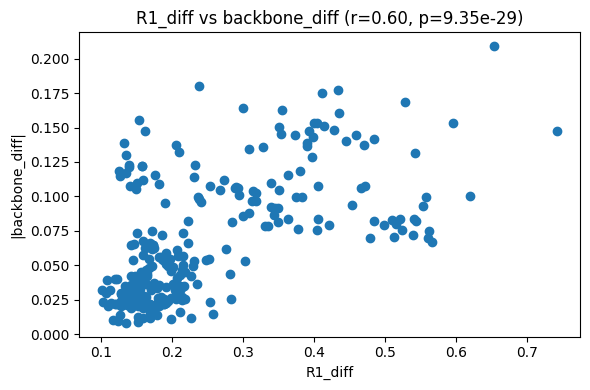

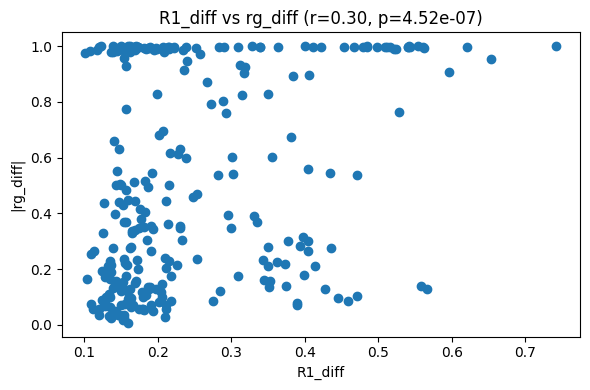

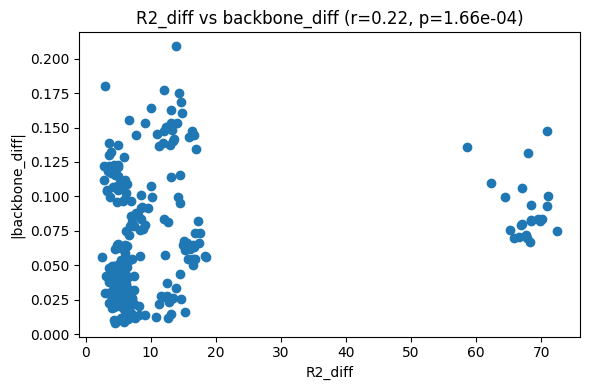

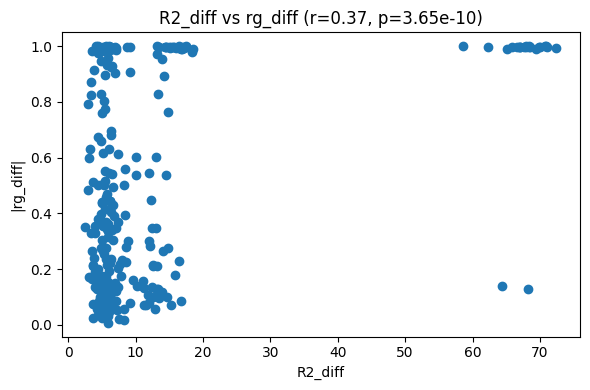

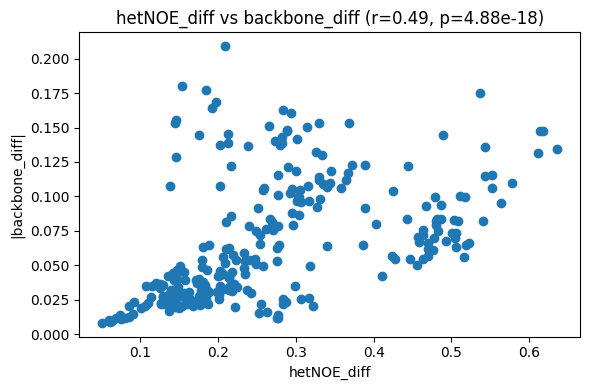

...

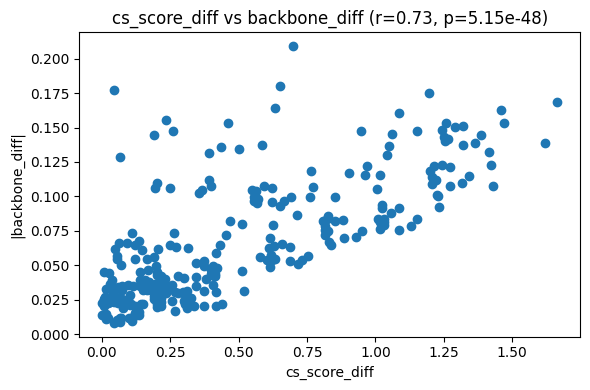

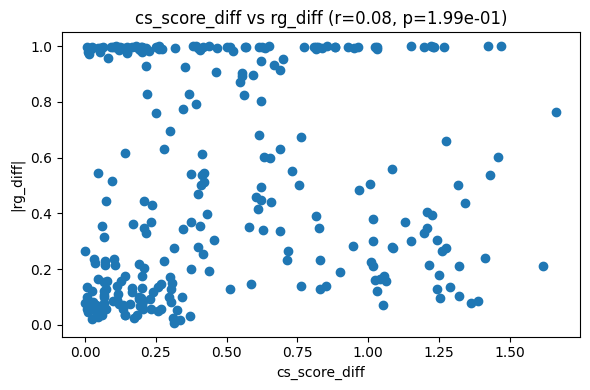

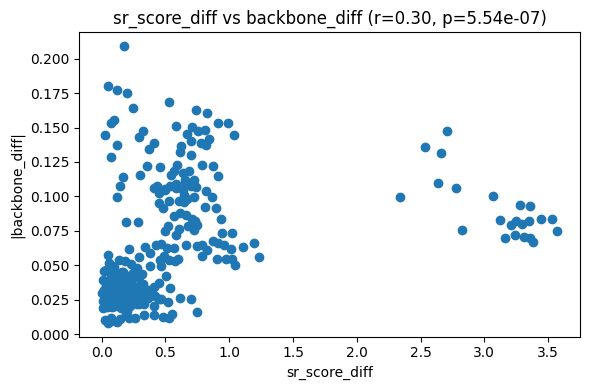

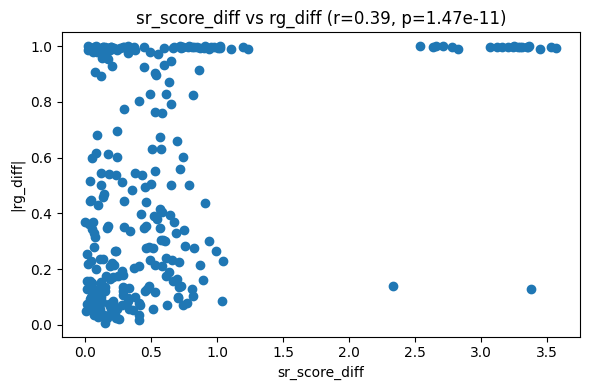

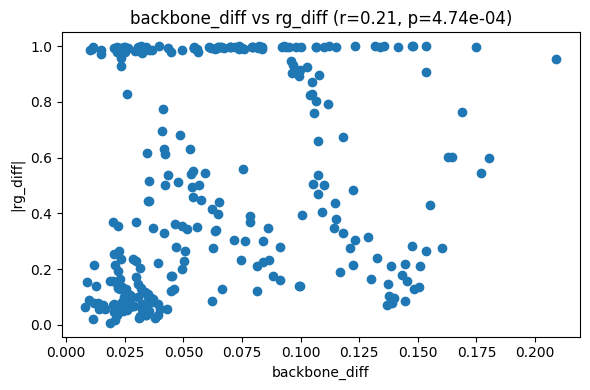

In [20]:
from scipy.stats import pearsonr

for x_key, y_key in itertools.combinations(comparison_data.keys(), 2):
    if 'backbone_diff' not in [x_key,y_key] and 'rg_diff' not in [x_key,y_key]:
        continue
    x_vals = np.abs(comparison_data[x_key])
    y_vals = np.abs(comparison_data[y_key])

    # Compute Pearson correlation
    if len(x_vals) == len(y_vals) and len(x_vals) > 1:
        r, p = pearsonr(x_vals, y_vals)
        corr_text = f"r={r:.2f}, p={p:.2e}"
    else:
        corr_text = "Not enough data"

    # Plot
    plt.figure(figsize=(6, 4))
    plt.scatter(x_vals, y_vals)
    plt.xlabel(x_key)
    plt.ylabel(f"|{y_key}|")
    plt.title(f"{x_key} vs {y_key} ({corr_text})")
    plt.tight_layout()
    plt.show()

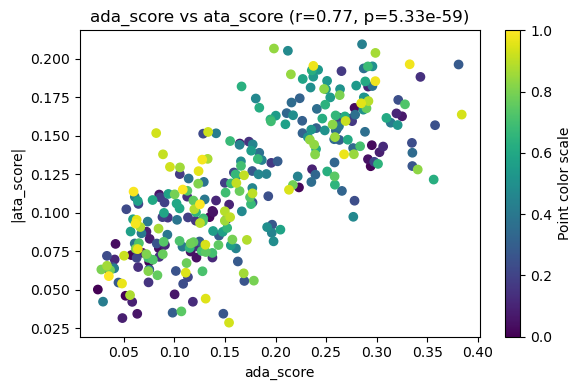

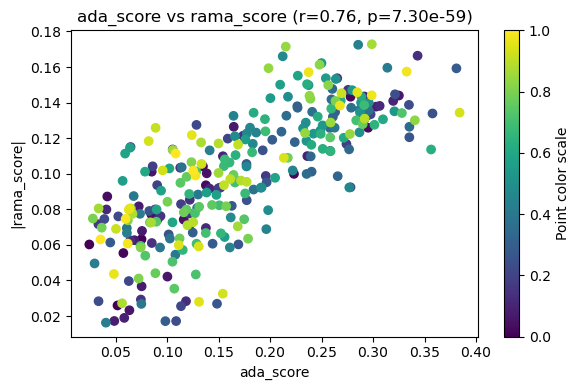

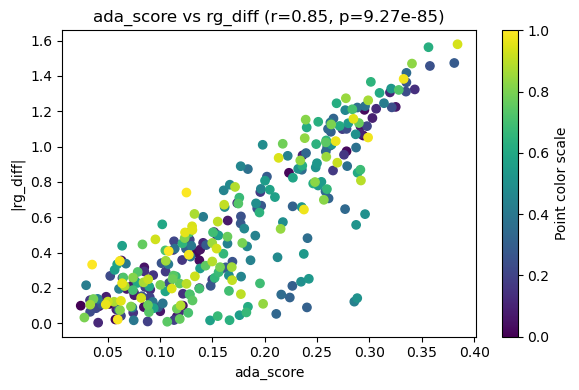

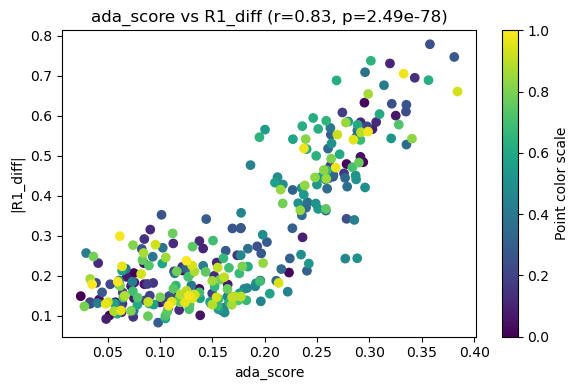

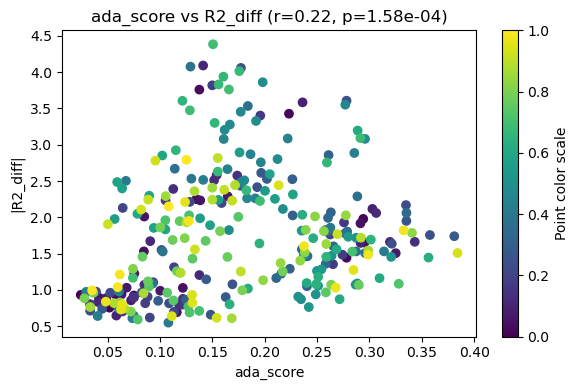

...

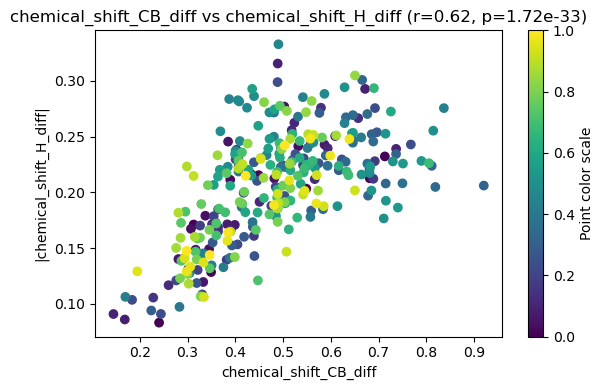

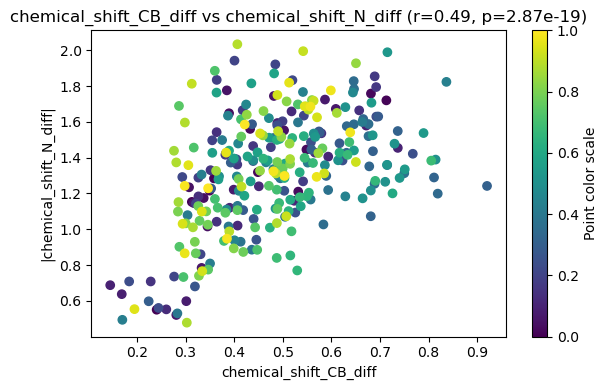

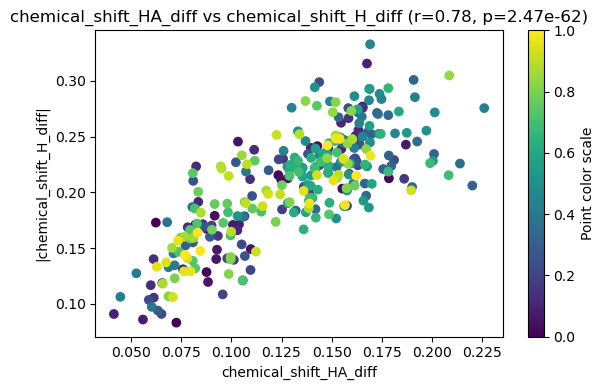

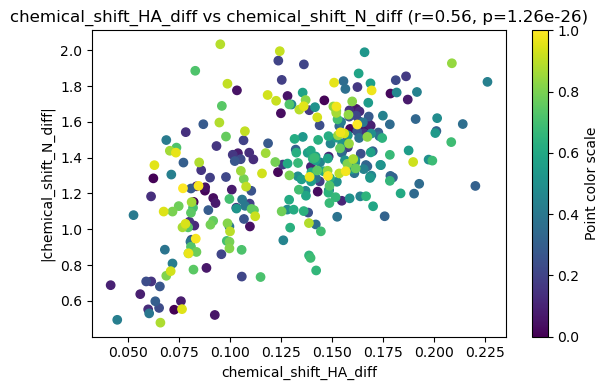

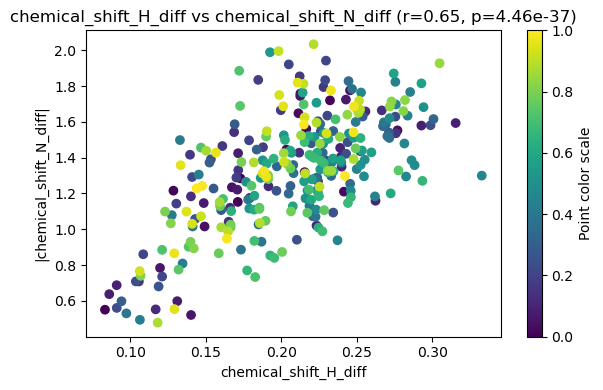

In [15]:
from scipy.stats import pearsonr
import itertools
import numpy as np
import matplotlib.pyplot as plt

# Example: a list/array with the same length as x_vals/y_vals
# This could be categorical, continuous, or custom colors
point_colors = np.linspace(0, 1, len(next(iter(comparison_data.values()))))  

for x_key, y_key in itertools.combinations(comparison_data.keys(), 2):
    x_vals = np.abs(comparison_data[x_key])
    y_vals = np.abs(comparison_data[y_key])

    # Compute Pearson correlation
    if len(x_vals) == len(y_vals) and len(x_vals) > 1:
        r, p = pearsonr(x_vals, y_vals)
        corr_text = f"r={r:.2f}, p={p:.2e}"
    else:
        corr_text = "Not enough data"

    # Plot
    plt.figure(figsize=(6, 4))
    plt.scatter(x_vals, y_vals, c=point_colors[:len(x_vals)], cmap="viridis")  
    plt.colorbar(label="Point color scale")  # optional
    plt.xlabel(x_key)
    plt.ylabel(f"|{y_key}|")
    plt.title(f"{x_key} vs {y_key} ({corr_text})")
    plt.tight_layout()
    plt.show()


In [11]:
for i in comparison_data:
    print(i)

ada_score
ata_score
rama_score
rg_diff


In [18]:
def plot_jsd_matrix(ens_a, ens_b, ax, cbar_limits=None):
    # Compute JSD-based scores.
    avg_score, score_matrix = get_adaJSD_matrix(
        ens_a, ens_b, bins="auto", return_bins=False
    )
    # Plot.
    ax.set_title(f"{ens_a.code} vs {ens_b.code} (adaJSD={avg_score:.3f})", fontsize=14)
    if cbar_limits is not None:
        _cbar_limits = {"vmin": cbar_limits[0], "vmax": cbar_limits[1]}
    else:
        _cbar_limits = {}
    im = ax.imshow(score_matrix, **_cbar_limits)
    ax.set_xlabel("j")
    ax.set_ylabel("i")
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.set_label("JSD_d")
    ax.set_xlabel("j", fontsize=14)
    ax.set_ylabel("i", fontsize=14)
    return ax


In [14]:
analysis = EnsembleAnalysis(ensembles)

NameError: name 'ensembles' is not defined

In [13]:
ens_1, ens_2 = analysis[code_l0]], analysis[code_list[1]]

NameError: name 'analysis' is not defined

In [16]:
avg_score, score_matrix = get_adaJSD_matrix(
        ens_1, ens_2, bins="auto", return_bins=False
    )

In [26]:
print(avg_score)
print(score_matrix)

0.09677672070730568
[[       nan        nan 0.0378003  ... 0.01923347 0.0193807  0.01473832]
 [       nan        nan        nan ... 0.02404403 0.02585612 0.02337872]
 [0.0378003         nan        nan ... 0.02563432 0.02449836 0.02271019]
 ...
 [0.01923347 0.02404403 0.02563432 ...        nan        nan 0.05130799]
 [0.0193807  0.02585612 0.02449836 ...        nan        nan        nan]
 [0.01473832 0.02337872 0.02271019 ... 0.05130799        nan        nan]]


In [28]:
np.nanmean(score_matrix)

0.09677672070730567

In [30]:
def off_diagonal_avg(mat, n=0):
    """
    Compute average of values farther than n from the diagonal.
    Ignores NaNs.
    """
    m = np.asarray(mat)
    mask = np.abs(np.subtract.outer(np.arange(m.shape[0]), np.arange(m.shape[1]))) > n
    values = m[mask]  # pick only values outside band
    return np.nanmean(values)

In [45]:
# Example: skip main diagonal and immediate neighbors
avg_far = off_diagonal_avg(score_matrix, n=10)
print("Average (|i-j| > 1):", avg_far)

Average (|i-j| > 1): 0.08986771431727202


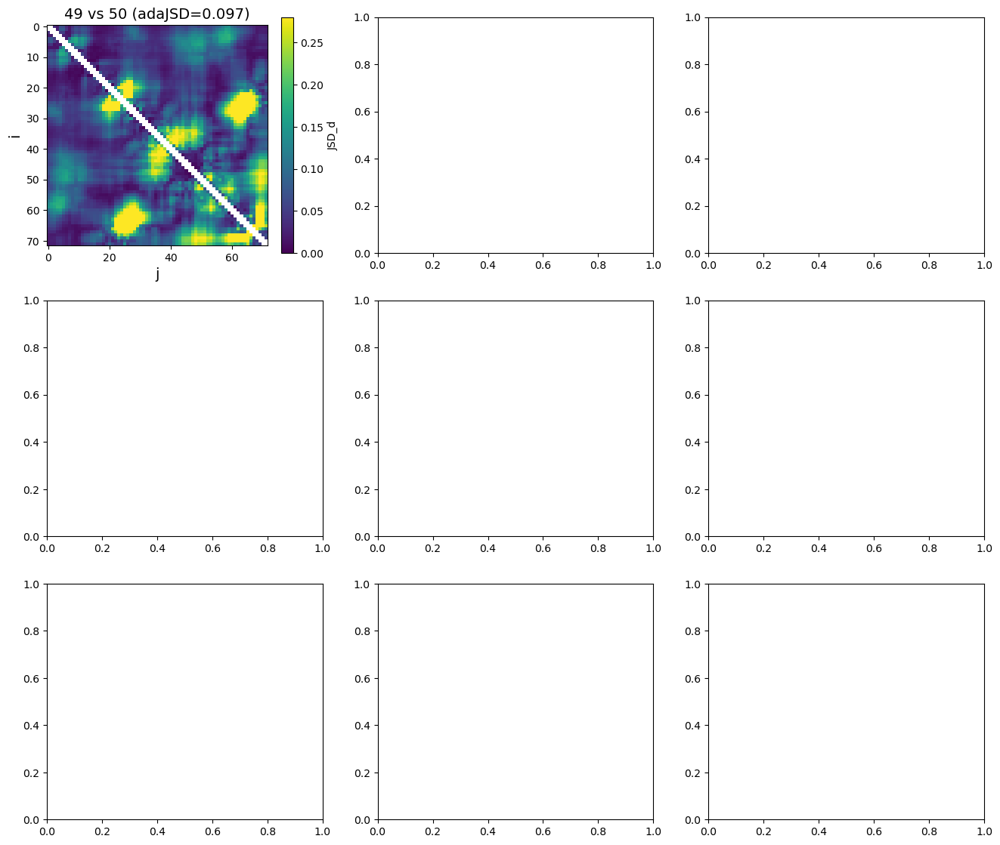

In [24]:
fig, ax = plt.subplots(3, 3, figsize=(16, 4.6*3))

row_count = 0
cbar_limits = (0, 0.28)
ylims_0 = (0.05, 0.425)
ylims_1 = (0, 0.210)

matrix = plot_jsd_matrix(ens_1, ens_2, ax[0][0],
                             cbar_limits=cbar_limits)

### Intitialize IDPET things

In [84]:

ensembles = []

for ID, xtc_path, gro_path in file_paths:
    fname = os.path.splitext(os.path.basename(xtc_path))[0]
    # Remove prefix/suffix
    code = ID
    #code = fname.replace("replica_", "").replace("_md_1500ns", "")
    ## Remove AMBER and CHARMM
    #code = re.sub(r"AMBER", "", code)
    #code = re.sub(r"CHARMM", "", code)

    relative_path = xtc_path
    folder_path = os.path.dirname(os.path.abspath(relative_path))
    
    # Paths
    xtc_file = xtc_path
    gro_file = gro_path
    nojump_traj = folder_path + '/nojump_traj.xtc'
    skipped_traj = folder_path + '/skipped_traj.xtc'
    skip_value = 10

    if not os.path.exists(skipped_traj):
        # Build the command: source GMXRC first, then run gmx
        cmd = f"""
        source /usr/local/gromacs/bin/GMXRC && \
        echo System | gmx trjconv -f {xtc_file} -s {gro_file} -skip {skip_value} -o {nojump_traj} -pbc nojump  && \
        echo -e "System\nSystem" | gmx trjconv -f {nojump_traj} -s {gro_file} -o {skipped_traj} -center
        """
        print(cmd)
        # Run inside a bash shell
        subprocess.run(cmd, shell=True, executable="/bin/bash", check=True)
    
    ens = Ensemble(
        code=code,
        data_path=skipped_traj,
        top_path=gro_path
    )
    ens.load_trajectory(data_dir=None)
    ensembles.append(ens)

# Example: compute Flory exponent for each ensemble
#for ens in ensembles:
#    flory_exp = ens.get_features("flory_exponent")[0]
#    print(f"{ens.code}: Flory exponent = {flory_exp:.3f}")

analysis = EnsembleAnalysis(ensembles)
analysis.load_trajectories()

vis = Visualization(analysis)  # Initializes a Visualization object for the analysis.

Loading trajectory for 2...
Loading trajectory for 3...
Loading trajectory for 2...
Loading trajectory for 3...


In [90]:
code_list = []
for e in analysis.ensembles:
    code_list.append(e.code)   # if it has .code

ens_1 = analysis[code_list[0]]
ens_2 = analysis[code_list[1]]

print('Systems with FAIRMD IDs', code_list[0], 'and', code_list[1],'analyzed')

Systems with FAIRMD IDs 2 and 3 analyzed


In [105]:
ada_score, ada_bins = score_adaJSD(ens_1, ens_2, bins="auto", return_bins=True)
print(f"- adaJSD score: {ada_score:.4f}, bins used: {bins}")

ata_score, ata_bins = score_ataJSD(ens_1, ens_2, bins="auto", return_bins=True)
print(f"- ataJSD score: {ata_score:.4f}, bins used: {bins}")

rama_score, rama_bins = score_ramaJSD(ens_1, ens_2, bins=5, return_bins=True)
print(f"- ramaJSD score: {rama_score:.4f}, bins used: {bins}")

- adaJSD score: 0.0244, bins used: 5
- ataJSD score: 0.0501, bins used: 5
- ramaJSD score: 0.0603, bins used: 5


In [134]:
R1_diff = RMSD_data[IDs[0]]['spin_relaxation']['R1']-RMSD_data[IDs[1]]['spin_relaxation']['R1']
R2_diff = RMSD_data[IDs[0]]['spin_relaxation']['R2']-RMSD_data[IDs[1]]['spin_relaxation']['R2']
hetNOE_diff = RMSD_data[IDs[0]]['spin_relaxation']['hetNOE']-RMSD_data[IDs[1]]['spin_relaxation']['hetNOE']
print(R1_diff, R2_diff, hetNOE_diff)

-0.0961706116205634 -0.20211908830480674 -0.1649123073037715


In [136]:
comparison_data = {
    'ada_score': [],
    'ata_score': [],
    'rama_score': [],
    'R1_diff': [],
    'R2_diff': [],
    'hetNOE_diff': [],
}

comparison_data['ada_score'].append(ada_score)
comparison_data['ata_score'].append(ata_score)
comparison_data['rama_score'].append(JSD_score)
comparison_data['R1_diff'].append(R1_diff)
comparison_data['R2_diff'].append(R2_diff)
comparison_data['hetNOE_diff'].append(hetNOE_diff)

print(comparison_data)

{'ada_score': [0.024420620373227814], 'ata_score': [0.05006101568974438], 'rama_score': [0.06025455513303972], 'R1_diff': [-0.0961706116205634], 'R2_diff': [-0.20211908830480674], 'hetNOE_diff': [-0.1649123073037715]}


Note how you can also provide as input to the functions `mdtraj` trajectories. This is helpful if you use `mdtraj` in your scripts and want to use IDPET to perform ensemble comparison with no visualization.

In [69]:
# We get mdtraj trajectories for the ensembles.
traj_1 = ens_1.trajectory
print("Input to score_adaJSD:", traj_1)

traj_2 = ens_2.trajectory
print("Input to score_adaJSD:", traj_2)

# score_adaJSD can take as input mdtraj objects.
score, bins = score_adaJSD(traj_1, traj_2, bins="auto", return_bins=True)
print(f"- adaJSD score: {score:.4f}, bins used: {bins}")
# Also other comparison methods take as input mdtraj trajectories.

Input to score_adaJSD: <mdtraj.Trajectory with 15001 frames, 1038 atoms, 67 residues, and unitcells>
Input to score_adaJSD: <mdtraj.Trajectory with 15001 frames, 1038 atoms, 67 residues, and unitcells>
- adaJSD score: 0.0244, bins used: 50


There is also a more complex way to compute average JSD values for `F` monodimensional distributions, which requires you to manually provide a `(N, F)` feature matrix. We only show how to do it for ataJSD (adaJSD is similar).

You can adapt it for any feature matrix of shape `(N, F)` and score any custom molecular feature.

You can also implement your own bootstrapping strategy with this system.

In [70]:
# Manually compute features (alpha_angles).
alpha_1 = ens_1.get_features(featurization="a_angle")
print("- features 1 shape:", alpha_1.shape)
alpha_2 = ens_2.get_features(featurization="a_angle")
print("- features 2 shape:", alpha_2.shape)

# Manually compute average JSD approximation. You can also provide any other
# 2d feature matrix as input to the `score_avg_jsd` function.
score, bins = score_avg_jsd(alpha_1, alpha_2, limits="a", bins="auto", return_bins=True)
print(f"- ataJSD score: {score:.4f}, bins used: {bins}")

- features 1 shape: (15001, 64)
- features 2 shape: (15001, 64)
- ataJSD score: 0.0501, bins used: 50


### Performing a bootstrap analysis with lower-level API.

In case you want to perform the statistical analysis illustrated above. We will use two ensembles here. The `all_vs_all_comparison()` function allows us to perform the boostrap analysis by setting the `bootstrap_iters` argument. `all_vs_all_comparison()` is the same function used by the This is the `Visualization.comparison_matrix()` method we used above, but this time we are directly making use of it, without creating any plots.

In [71]:
# Perform bootstrap analysis on the two ensembles using adaJSD. 
comparison_out  = all_vs_all_comparison(
    ensembles=[ens_1, ens_2],
    score="adaJSD",
    bootstrap_iters=10,
    bins="auto"
)
# We can optionally use calculate boostrap confidence intervals.
comparison_out = process_all_vs_all_output(comparison_out)

# Print the results of the analysis.
intra_comparison_scores = comparison_out["scores"][0,0]
intra_comparison_ci = comparison_out["confidence_intervals"][0,0]
inter_comparison_scores = comparison_out["scores"][0,1]
inter_comparison_ci = comparison_out["confidence_intervals"][0,1]
inter_comparison_p_value = comparison_out["p_values"][0,1]
print(f"Mean intra-comparison score: {intra_comparison_scores.mean():.4f}")
print(f"Confidence intervals for intra-comparison score: [{intra_comparison_ci[0]:.4f}, {intra_comparison_ci[1]:.4f}]")
print(f"Mean inter-comparison score: {inter_comparison_scores.mean():.4f}")
print(f"Confidence intervals for inter-comparison score: [{inter_comparison_ci[0]:.4f}, {inter_comparison_ci[1]:.4f}]")
print(f"Inter-comparison score p-value: {inter_comparison_p_value}")


Mean intra-comparison score: 0.0008
Confidence intervals for intra-comparison score: [0.0008, 0.0008]
Mean inter-comparison score: 0.0254
Confidence intervals for inter-comparison score: [0.0249, 0.0258]
Inter-comparison score p-value: 9.133589555477501e-05


### Rationalizing JSD-based scores

Finally, IDPET allows you to analyze the results obtained by comparing two ensembles with adaJSD, ataJSD and ramaJSD.

All these scores compute JSD approximations for molecular features belonging to different residues (or group of residues) and then averages them.

While an average score can provide useful information, looking at the pattern of individual JSD scores can help making better sense of the differences between two ensembles.

Via the `get_adaJSD_matrix()` function you can access the raw scores for each $C\alpha$-$C\alpha$ distance. Use the `plot_jsd_d_matrix()` function to plot them.

Similarly, the `get_ramaJSD_profile()`, `get_ataJSD_profile()` functions return scores for each angle. We will only look at ataJSD scores here. Use the `plot_jsd_t_profile()` to plot them.

[[       nan        nan 0.01557938 ... 0.00430674 0.00392969 0.003725  ]
 [       nan        nan        nan ... 0.0045391  0.00390999 0.00399289]
 [0.01557938        nan        nan ... 0.00516689 0.00455682 0.00434433]
 ...
 [0.00430674 0.0045391  0.00516689 ...        nan        nan 0.01631058]
 [0.00392969 0.00390999 0.00455682 ...        nan        nan        nan]
 [0.003725   0.00399289 0.00434433 ... 0.01631058        nan        nan]]
[[       nan        nan 0.01557938 ... 0.00430674 0.00392969 0.003725  ]
 [       nan        nan        nan ... 0.0045391  0.00390999 0.00399289]
 [0.01557938        nan        nan ... 0.00516689 0.00455682 0.00434433]
 ...
 [0.00430674 0.0045391  0.00516689 ...        nan        nan 0.01631058]
 [0.00392969 0.00390999 0.00455682 ...        nan        nan        nan]
 [0.003725   0.00399289 0.00434433 ... 0.01631058        nan        nan]]


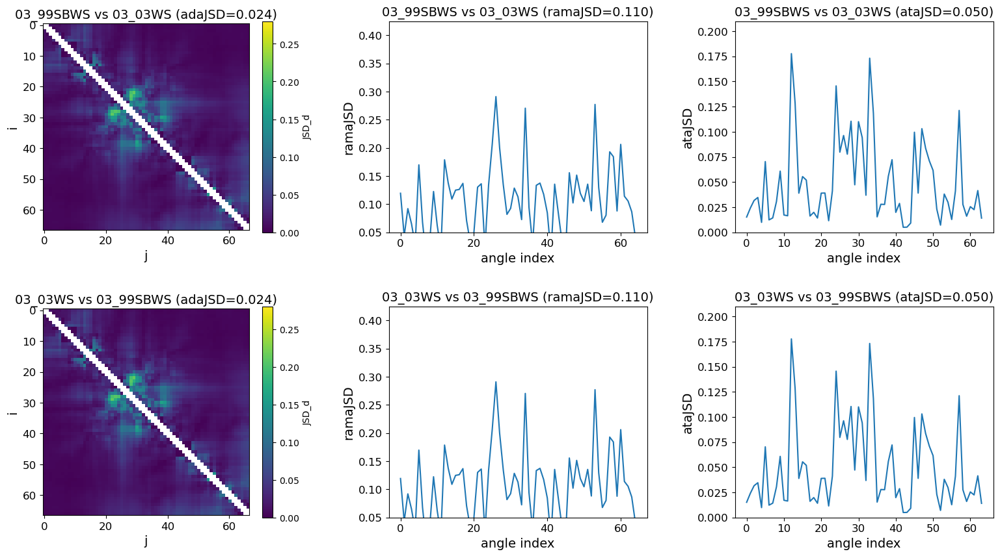

In [80]:
def plot_jsd_matrix(ens_a, ens_b, ax, cbar_limits=None):
    # Compute JSD-based scores.
    avg_score, score_matrix = get_adaJSD_matrix(
        ens_a, ens_b, bins="auto", return_bins=False
    )
    print(score_matrix)
    # Plot.
    ax.set_title(f"{ens_a.code} vs {ens_b.code} (adaJSD={avg_score:.3f})", fontsize=14)
    if cbar_limits is not None:
        _cbar_limits = {"vmin": cbar_limits[0], "vmax": cbar_limits[1]}
    else:
        _cbar_limits = {}
    im = ax.imshow(score_matrix, **_cbar_limits)
    ax.set_xlabel("j")
    ax.set_ylabel("i")
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.set_label("JSD_d")
    ax.set_xlabel("j", fontsize=14)
    ax.set_ylabel("i", fontsize=14)
    return ax


def plot_jsd_profile(ens_a, ens_b, ax, score_name, ylims=None):
    # Compute JSD-based scores.
    if score_name == "ataJSD":
        avg_score, score_profile = get_ataJSD_profile(
            ens_a, ens_b, bins="auto", return_bins=False
        )
    elif score_name == "ramaJSD":
        avg_score, score_profile = get_ramaJSD_profile(
            ens_a, ens_b, bins="auto", return_bins=False
        )
    else:
        raise KeyError(score_name)
    
    # Plot.
    ax.set_title(f"{ens_a.code} vs {ens_b.code} ({score_name}={avg_score:.3f})", fontsize=14)
    im = ax.plot(score_profile)
    ax.set_xlabel("angle index")
    ax.set_ylabel(score_name)
    ax.set_xlabel("angle index", fontsize=14)
    ax.set_ylabel(score_name, fontsize=14)
    ax.set_ylim(ylims)

    return ax


fig, ax = plt.subplots(2, 3, figsize=(16, 4.6*2))  # only 2 rows now

row_count = 0
cbar_limits = (0, 0.28)
ylims_0 = (0.05, 0.425)
ylims_1 = (0, 0.210)

for ens_a, ens_b in [
        (ens_1, ens_2),
        (ens_2, ens_1),   # remove this line if you only want one direction
    ]:
    jsd_prof = plot_jsd_profile(ens_a, ens_b, ax[row_count][2], "ataJSD",
                                ylims=ylims_1)
    jsd_prof_rama = plot_jsd_profile(ens_a, ens_b, ax[row_count][1], "ramaJSD",
                                     ylims=ylims_0)
    matrix = plot_jsd_matrix(ens_a, ens_b, ax[row_count][0],
                             cbar_limits=cbar_limits)
    jsd_prof.tick_params(axis='both', labelsize=12)
    jsd_prof_rama.tick_params(axis='both', labelsize=12)
    matrix.tick_params(axis='both', labelsize=12)
    row_count += 1

plt.tight_layout(pad=3)
plt.show()


The higher a JSD score is, the higher the divergence between two distributions.

Clearly, the differences in $C\alpha$-$C\alpha$ distances and $\alpha$ angles of PED00156 and PED00157 are localized to specific regions. For examples, the most divergent $C\alpha$-$C\alpha$ distributions are the ones between residues an N-terminal patch of residues (~0-20) and a C-terminal patch (~45-58).

Let's confirm this by plotting some histograms of $C\alpha$-$C\alpha$ distances and $\alpha$ angles, specifically for those residues having high individual JSD scores.

The histograms reflect a difference in distributions between PED00156 and PED00157.

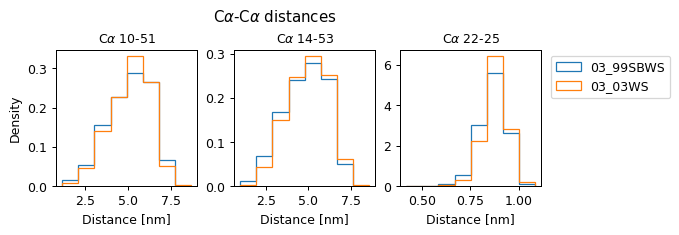

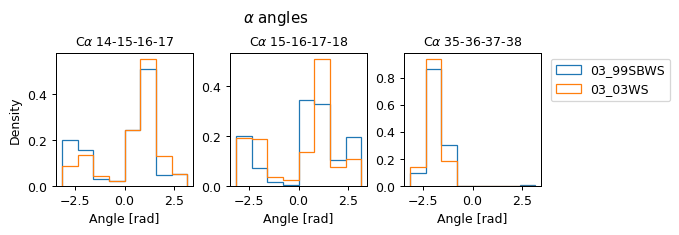

In [75]:
n_bins = 8

vis.plot_histogram_grid(
    feature="ca_dist",
    n_rows=1,
    n_cols=3,
    ids=[[10, 51], [14, 53], [22, 25]],  # Residue pairs appearing to have high JSD_d scores.
    bins=n_bins,
    subplot_width=2.0,
    subplot_height=2.5
);

vis.plot_histogram_grid(
    feature="a_angle",
    n_rows=1,
    n_cols=3,
    ids=[14, 15, 35],  # Residue indices appearing to have high JSD_t scores.
    bins=n_bins,
    subplot_width=2.0,
    subplot_height=2.5
);

The results from this analysis point at well-defined differences between PED00156 and PED00157. They could be used to drive an analysis of 3D conformers to directly visualize the structural differences in the ensembles.